In [1]:
import coinmarketcap

from pandas_datareader import data
import matplotlib.pyplot as plt
import pandas as pd
import datetime
import math
import numpy as np
from scipy import stats
from scipy.stats import norm
import pandas as pd

import seaborn as sns



from statsmodels.graphics.tsaplots import plot_acf
from matplotlib import pyplot
from arch import arch_model

In [2]:
# 10 largest cryptocurrencies + bitcoin
# We have manualy chosen a starting date for every currency, avioding the initial period when the price stays low and does not move much
top_crypto_tickers = ["BTC-USD","ETH-USD","XRP-USD","LTC-USD","BCH-USD","EOS-USD","BNB-USD","XLM-USD","ADA-USD","TRX-USD","XMR-USD"]
start_dates = ['2013-04-28','2016-03-07','2015-01-01','2013-11-30','2017-07-31','2017-06-28','2017-08-14','2017-05-21','2017-11-09','2017-12-12','2016-06-09']

In [3]:
def compute_stats(start_dates,end,tickers):
    t_lst=[]
    mu_lst=[]
    sig2_lst=[]
    sk_lst=[]
    ku_lst=[]
    autocorrs=[]
    
    m_caps = []
    m_vols = []
    last_dates=[]
    first_dates=[]
    lens=[]

    companies=[]

    for i,t in enumerate(tickers):
        try:
            print(i)
            start_date = start_dates[i]
            company = data.DataReader(t, 'yahoo', start_date, end)

            company['Log']=np.log(company['Adj Close'])
            Returns=np.diff(company['Log'])*100
            Returns=np.append(0,Returns)
            company['Returns']=Returns

            T = len(company['Returns'])
            mu=(1/T)*np.sum(company['Returns'])
            sig2 = 1/(T-1) * np.sum([np.square((x - mu)) for x in company['Returns']])
            sk = 1/((T-1) * math.pow(math.sqrt(sig2),3)) * np.sum([math.pow(x - mu,3) for x in company['Returns']])
            ku = 1/((T-1) * math.pow(math.sqrt(sig2),4)) * np.sum([math.pow(x - mu,4) for x in company['Returns']])-3    
            autocorr = company['Returns'].autocorr()
            
            m_cap = data.get_quote_yahoo(t)['marketCap'][0]
            m_vol = data.get_quote_yahoo(t)['regularMarketVolume'][0]
            last_date = max(company.index)
            first_date = min(company.index)
            length = len(company)
            
            
            t_lst.append(t)
            mu_lst.append(mu)
            sig2_lst.append(sig2)
            sk_lst.append(sk)
            ku_lst.append(ku)
            autocorrs.append(autocorr)

            m_caps.append(m_cap)
            m_vols.append(m_vol)
            first_dates.append(first_date)
            last_dates.append(last_date)
            lens.append(length)

            companies.append(company)
        except:
            print('err')

    stock_stats = pd.DataFrame()

    stock_stats['mu'] = mu_lst
    stock_stats['sig2'] = sig2_lst
    stock_stats['sk'] = sk_lst
    stock_stats['ku'] = ku_lst
    stock_stats['ticker'] = t_lst
    stock_stats['AR1'] = autocorrs

    stock_stats['market_cap'] = m_caps
    stock_stats['market_volume'] = m_vols
    stock_stats['starting_date'] = first_dates
    stock_stats['end_date'] = last_dates
    stock_stats['length'] = lens
    
    
        
    return companies, stock_stats

In [4]:
# Load the series, performing the nesesary calculations
end = datetime.date.today()
cryptos, stats = compute_stats(start_dates,end,top_crypto_tickers)

0
1
2
3
4
5
6
7
8
9
10


# Question 2

In [5]:
stats[['ticker', 'market_cap', 'market_volume', 'starting_date', 'end_date', 'length']]

,ticker,market_cap,market_volume,starting_date,end_date,length
0,BTC-USD,150239002624,292381472,2013-04-27,2019-06-14,2239
1,ETH-USD,27473461248,104294424,2016-03-07,2019-06-14,1195
2,XRP-USD,39726764032,14321535,2015-01-21,2019-06-14,1606
3,LTC-USD,8115423232,47191780,2013-11-30,2019-06-14,2023
4,BCH-USD,7278786560,24230846,2017-07-31,2019-06-14,683
5,EOS-USD,4198098688,13014562,2017-06-28,2019-06-14,716
6,BNB-USD,4472439296,181497,2017-08-13,2019-06-14,670
7,XLM-USD,2379736064,1232771,2017-05-20,2019-06-14,755
8,ADA-USD,2276137472,1099795,2017-11-09,2019-06-14,583
9,TRX-USD,2096013696,586917,2017-12-12,2019-06-14,550


# Question 3

In [6]:
for i,ds in enumerate(cryptos):
    ds['date'] = ds.index
    ds['ticker'] = [top_crypto_tickers[i]]*len(ds)
    ds['std_price'] = (ds['Adj Close'] - ds['Adj Close'].mean())/ds['Adj Close'].std()
    
total_ds = pd.concat(cryptos)

Prices of cryptocurencies


/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


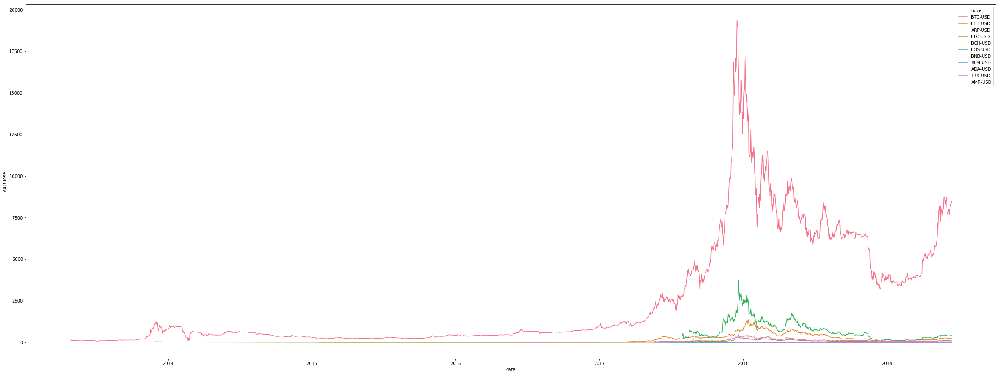

In [7]:
print('Prices of cryptocurencies')

# data = total_ds[total_ds['ticker']!='BTC-USD']
data = total_ds

plt.figure(figsize=(40, 15))
ax = sns.lineplot(y="Adj Close", x='date', hue='ticker', data=data)

Standardized prices of cryptocurencies


/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


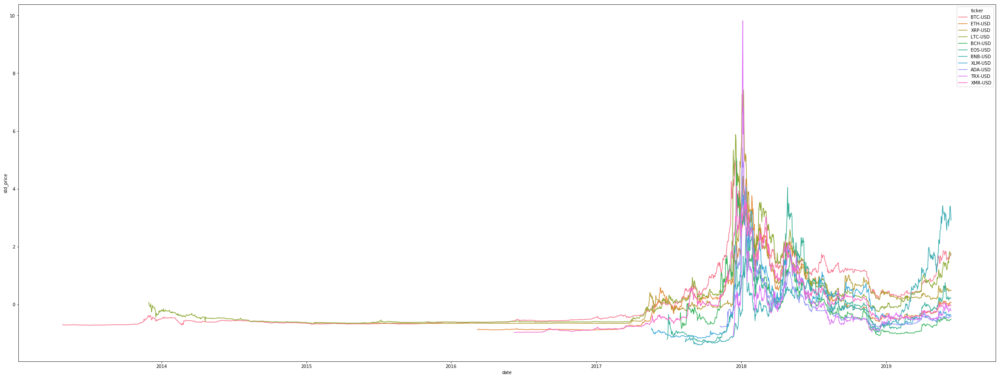

In [8]:
print('Standardized prices of cryptocurencies')

# data = total_ds[total_ds['ticker']!='BTC-USD']
data = total_ds

plt.figure(figsize=(40, 15))
ax = sns.lineplot(y="std_price", x='date', hue='ticker', data=data)

## Comments

The trend in the prices of the 11 currencies seems very correlated in general. This is further evident when we see standardised prices.

# Question 4

currency -  BTC-USD


/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


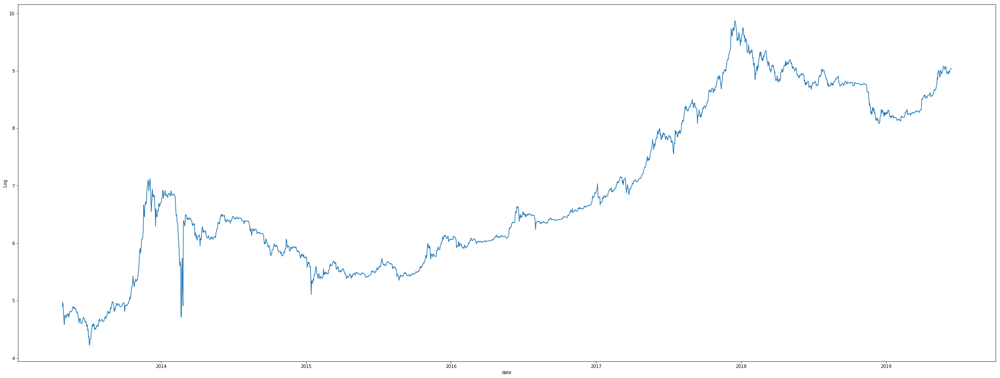


currency -  ETH-USD


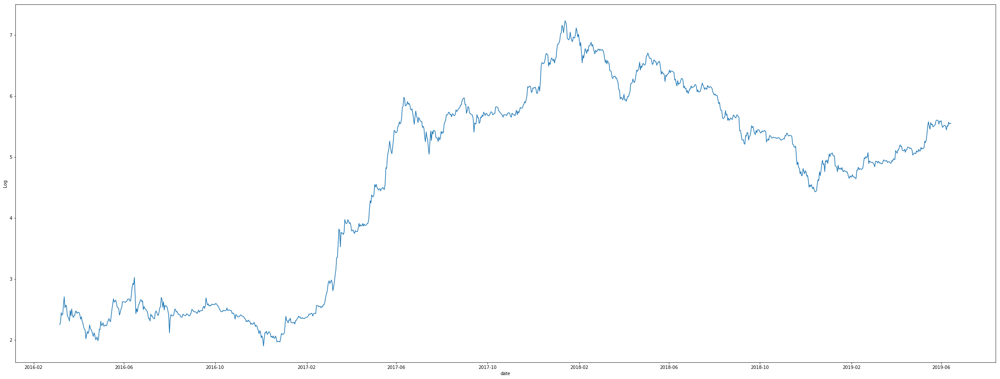


currency -  XRP-USD


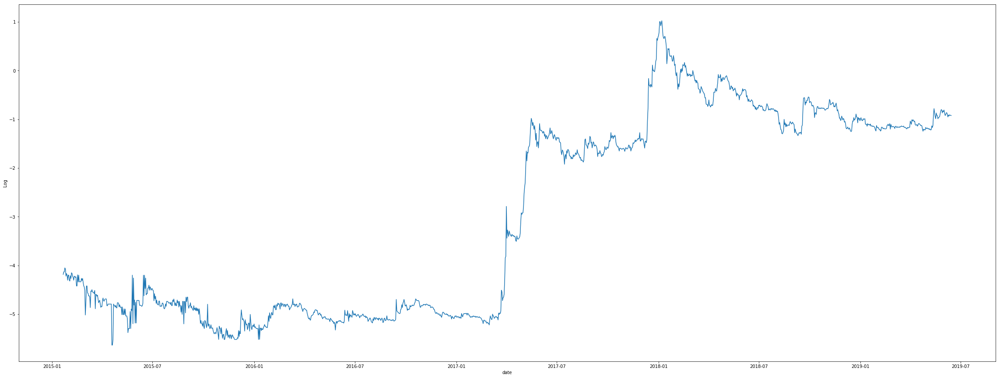


currency -  LTC-USD


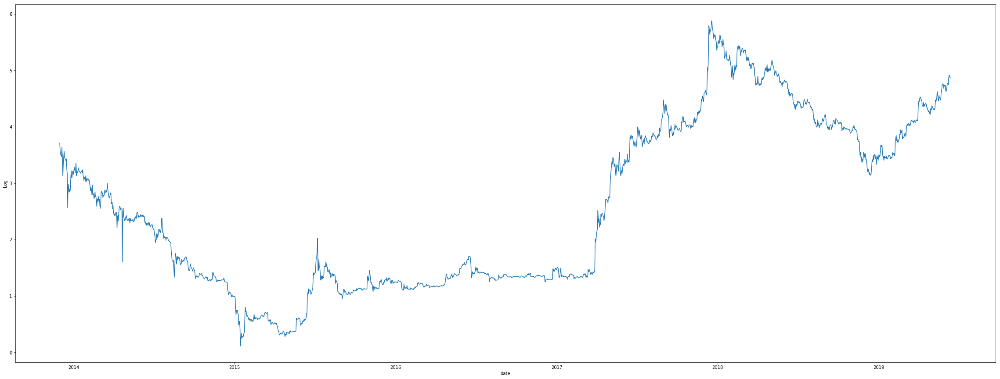


currency -  BCH-USD


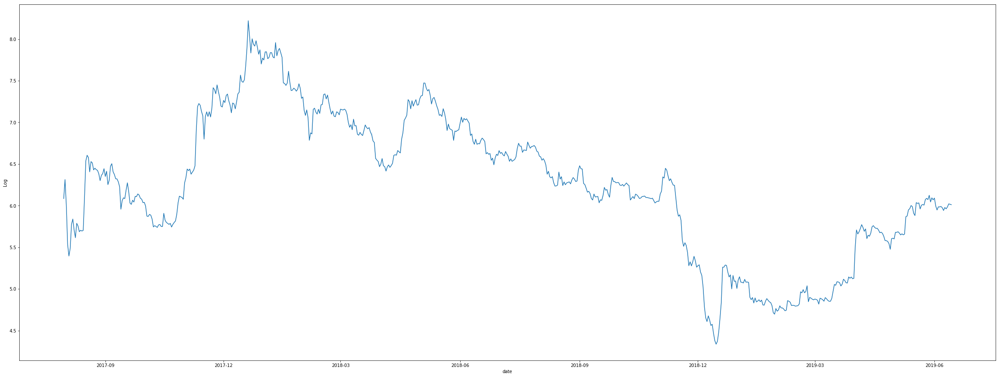


currency -  EOS-USD


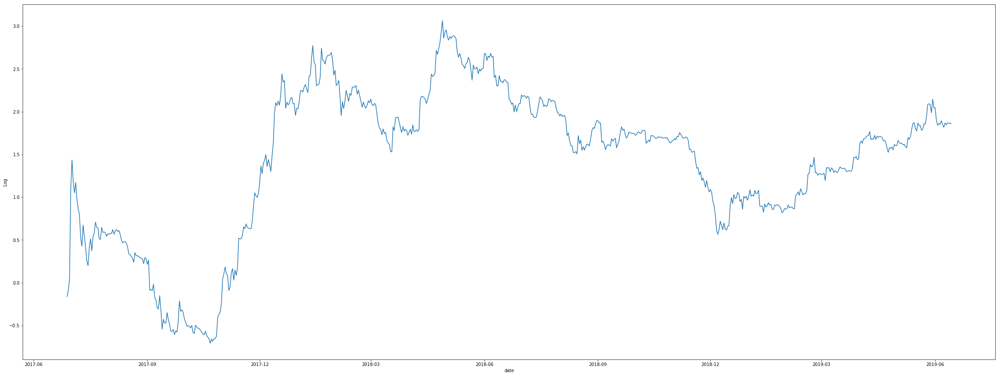


currency -  BNB-USD


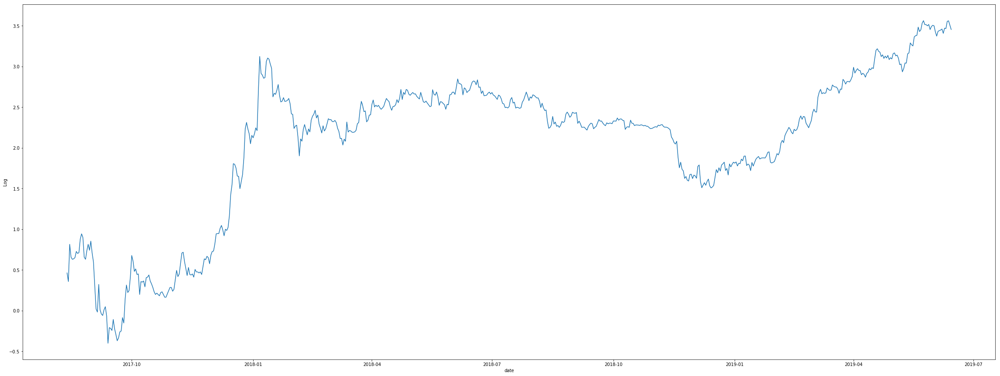


currency -  XLM-USD


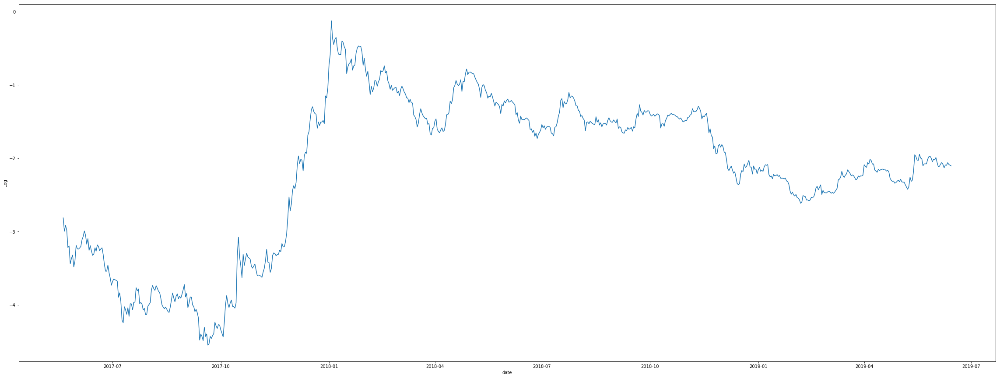


currency -  ADA-USD


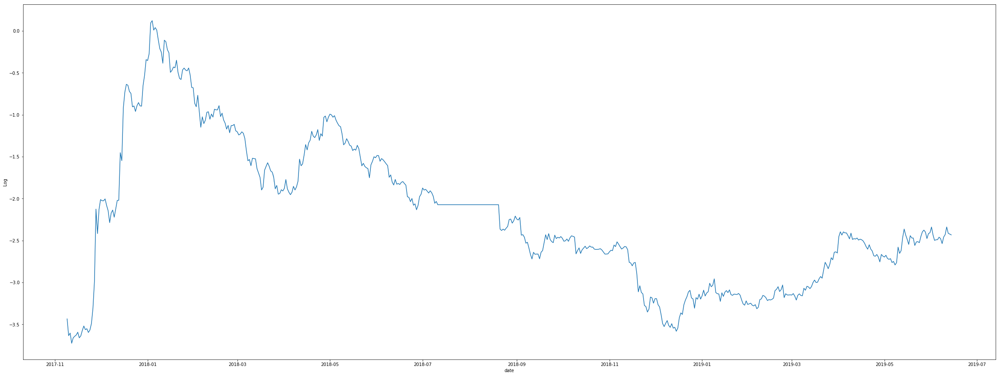


currency -  TRX-USD


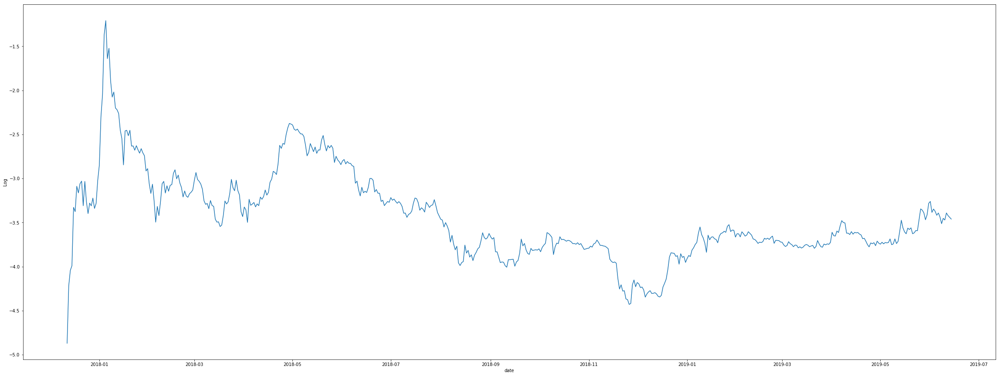


currency -  XMR-USD


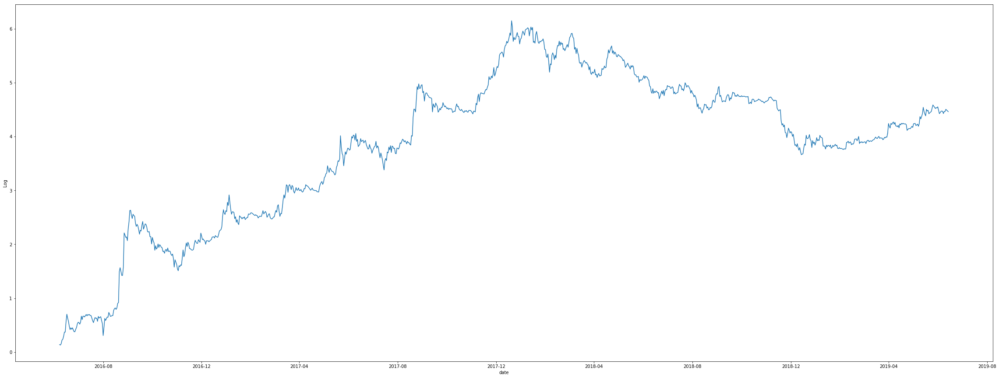

In [9]:
# separate charts for every currency 

for ticker,ds in zip(top_crypto_tickers,cryptos):
    print('currency - ',ticker)
    plt.figure(figsize=(40, 15))
    ax = sns.lineplot(y="Log", x='date', data=ds)
    plt.show()
    print()

In [10]:
# The stats table
# ! autocorelation coefficient !!! 
print('descriptive statistics')
stats[['ticker','mu', 'sig2', 'sk', 'ku','AR1']]

descriptive statistics


,ticker,mu,sig2,sk,ku,AR1
0,BTC-USD,0.184992,37.929486,5.569748,180.884461,0.000369
1,ETH-USD,0.276287,37.883078,0.039975,3.277845,-0.015845
2,XRP-USD,0.203077,113.181581,0.838328,23.821838,-0.339478
3,LTC-USD,0.056951,48.633633,-0.031723,39.046738,-0.119705
4,BCH-USD,-0.010794,73.990486,0.645170,5.889091,0.135917
5,EOS-USD,0.282567,85.035687,2.321233,24.460522,0.049354
6,BNB-USD,0.446560,64.895960,0.719978,7.016001,0.029789
7,XLM-USD,0.093888,71.107347,0.944257,7.210220,-0.004693
8,ADA-USD,0.171878,77.607837,2.794414,22.999717,0.012118
9,TRX-USD,0.256271,92.808787,1.914208,14.385276,0.046637


## Comments 

The currencies vary a lot in terms of volatility. Bitcoin and Ethereum seem to be the least volatile as they have lower standard deviation in returns.Ripple and Tron are the most volatile. Most of the currencies have positive skewness which implies that positive news has a higher positive impact on returns than the negative impact by negative news. Bitcoin is significantly higher than other currencies which implies the returnd go upward much faster for Bitcoin than other currencies. 

Comparing to the stocks explored in the first homework these assets seem much more riscy volitile

# Question 5

In [11]:
comm_start_date = max(stats['starting_date']) # the date from which all the currencies exist
common_series = [c[c['date']>comm_start_date] for c in cryptos]

In [12]:
currencies = common_series[1:]
names = top_crypto_tickers[1:]
pair_corrs=[]
pair_corr_names=[]

for i in range (0,len(currencies)):
    for j in range(i+1, len(currencies)):
        a = currencies[i]['Returns']
        b = currencies[j]['Returns']
        n1 = names[i]
        n2 = names[j]
        
        rc = a.rolling(60).corr(other=b)
        
        pair_corrs.append(rc)
        pair_corr_names.append(n1+' / '+n2)
        
pair_corrs_df = pd.concat(pair_corrs,axis=1)
mean_pair_corrs = pair_corrs_df.mean(axis=1)

Average pairwise correlation


/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


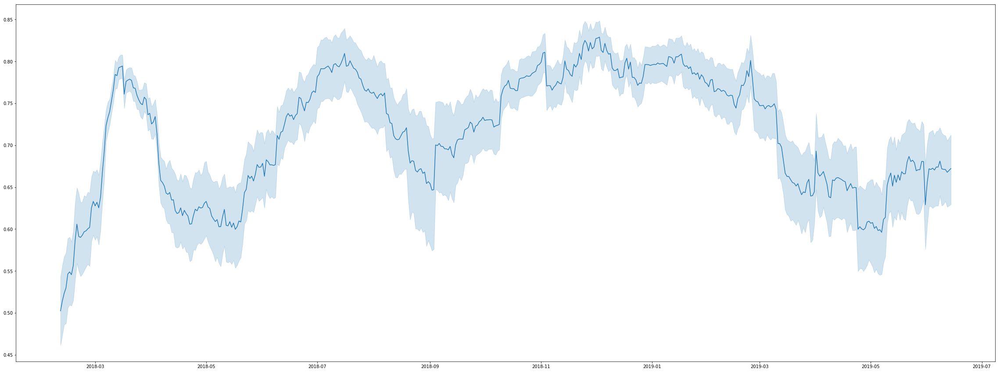

In [13]:
print('Average pairwise correlation')

data = pd.concat( [a[59:] for a in pair_corrs],axis=0)
plt.figure(figsize=(40, 15))
sns.lineplot(data=data,estimator='mean',ci=95)

## Comment
The average corelations between cryptocurrencies has fluctuated a lot, but its on a downward trend in the recent times although its still at almost 70%. This implies that the returns fluctuate similarly for the cryptocurrencues. (for 6)

# Question 6

In [14]:
currencies = common_series[1:]
names = top_crypto_tickers[1:]
target = common_series[0]['Returns']
pair_corrs=[]
pair_corr_names=[]

for i in range (0,len(currencies)):

    a = currencies[i]['Returns']
    n1 = names[i]
    rc = a.rolling(60).corr(other=target)
        
    pair_corrs.append(rc)
    pair_corr_names.append(n1+' / '+'BTC-USD')
        
pair_corrs_df = pd.concat(pair_corrs,axis=1)
mean_pair_corrs = pair_corrs_df.mean(axis=1)

Average pairwise correlation


/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


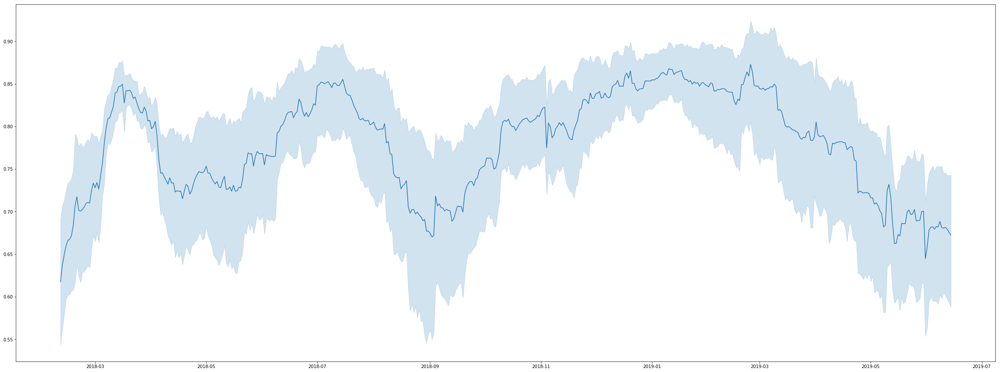

In [15]:
print('Average pairwise correlation')

data = pd.concat( [a[59:] for a in pair_corrs],axis=0)
plt.figure(figsize=(40, 15))
sns.lineplot(data=data,estimator='mean',ci=95)

## Comment
The correlation of all the currencies with bitcoin has the same evolution pattern as the average pairwise correlation. Overall the average correlation is quite high, which supports the hyppothesis that all the currencies prices move jointly most of the time. There does not seem to be a strong trend in correlation for the whole time period, but for the last year it has been decreasing stedily. 

# Question 7

In [16]:
def var_and_acf(curr):
    print('\n****************************')
    print('Data for ',curr['ticker'][0])
    print('****************************\n')
    BTC = curr
    squared_data = [x**2 for x in BTC['Returns']]

    print("Variance, (assuming a zero mean)")
    plt.figure(figsize=(40, 15))
    pyplot.plot(squared_data)
    pyplot.show()
    
    print('ACF plot')
    plot_acf(squared_data, lags = 30)
    pyplot.show()
    
def GARCH(curr,p,q):
    print('\n****************************')
    print('Data for ',curr['ticker'][0])
    print('****************************\n')
    BTC = curr
    n_test = 50
    train, test = BTC['Returns'][:-n_test], BTC['Returns'][-n_test:]

    model = arch_model(train, mean='Zero', vol='GARCH', p=p, q=q)
    model_fit = model.fit()
    print(model_fit.summary)
    
    yhat = model_fit.forecast(horizon=n_test)

    plt.figure(figsize=(40, 15))
    pyplot.plot(yhat.variance.values[-1, :])
    pyplot.plot(list(test[:]))
    pyplot.show()


****************************
Data for  BTC-USD
****************************

Variance, (assuming a zero mean)


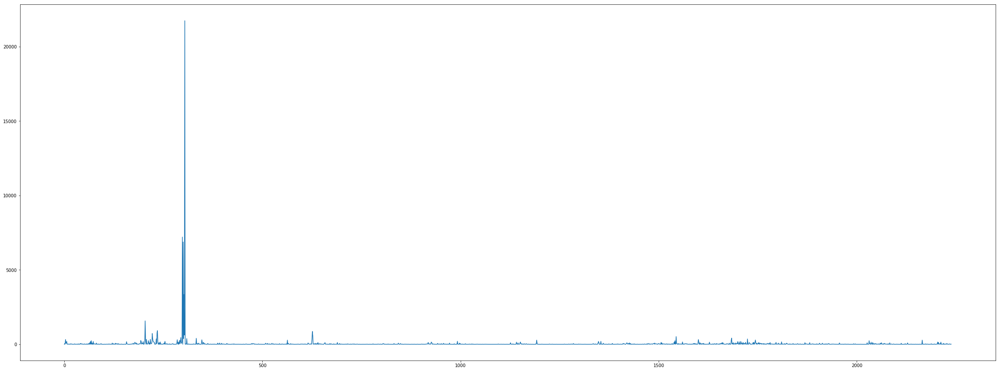

ACF plot


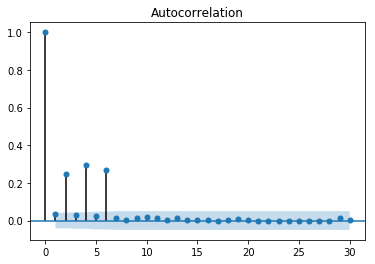


****************************
Data for  ETH-USD
****************************

Variance, (assuming a zero mean)


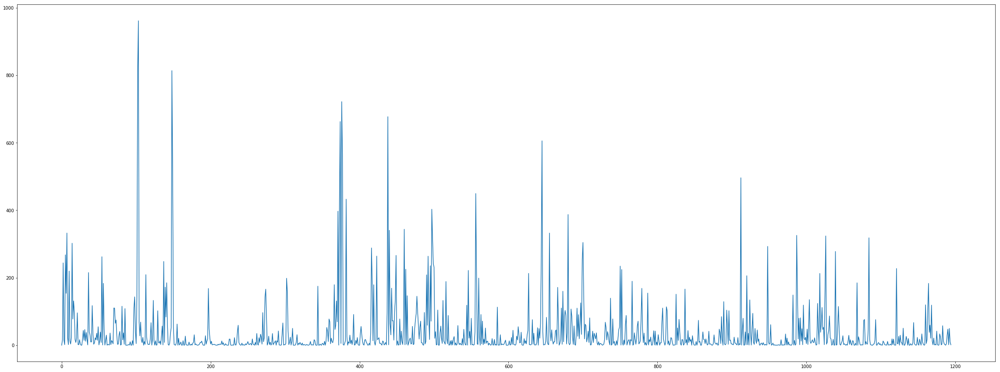

ACF plot


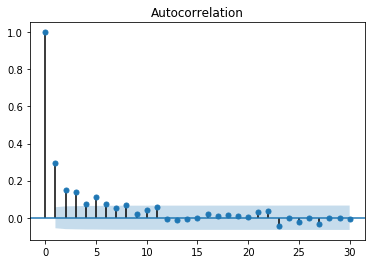


****************************
Data for  XRP-USD
****************************

Variance, (assuming a zero mean)


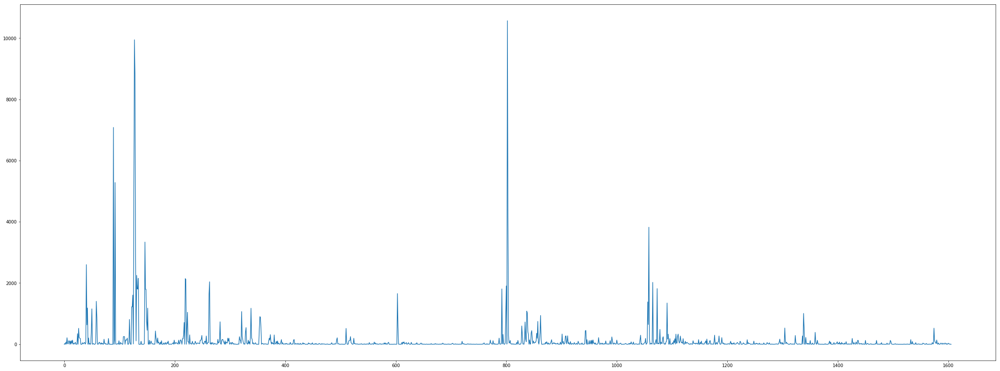

ACF plot


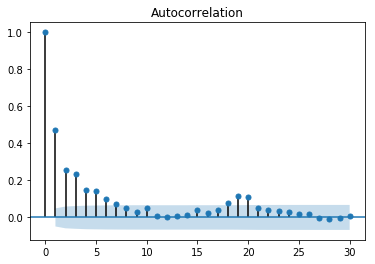


****************************
Data for  LTC-USD
****************************

Variance, (assuming a zero mean)


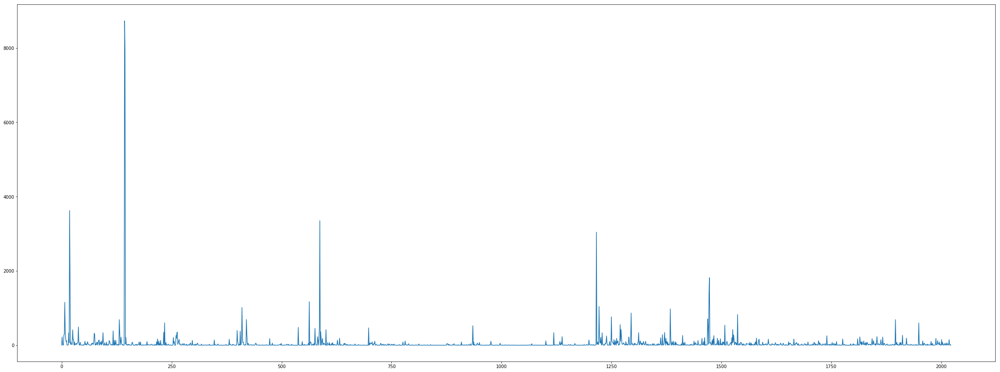

ACF plot


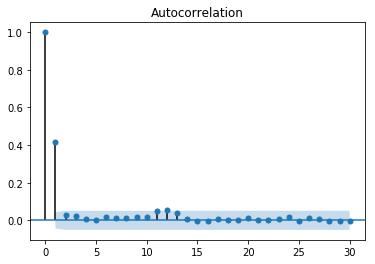


****************************
Data for  BCH-USD
****************************

Variance, (assuming a zero mean)


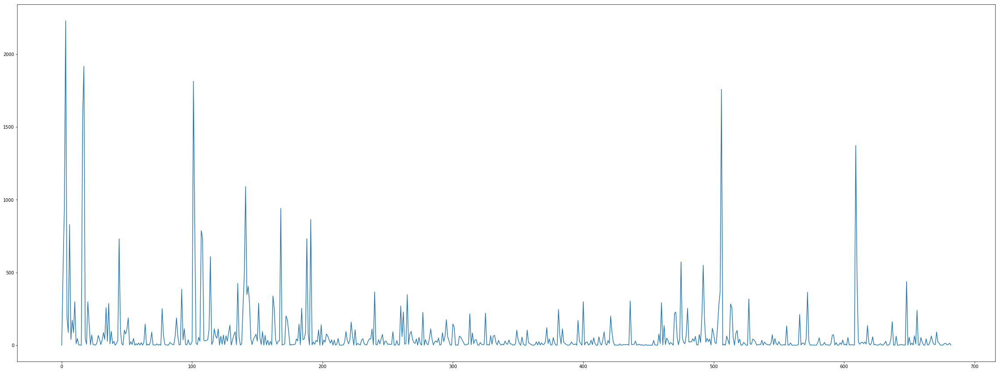

ACF plot


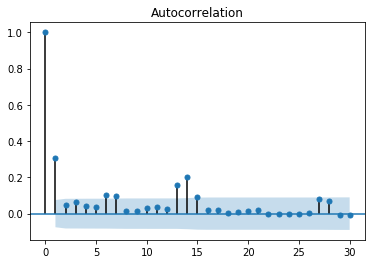


****************************
Data for  EOS-USD
****************************

Variance, (assuming a zero mean)


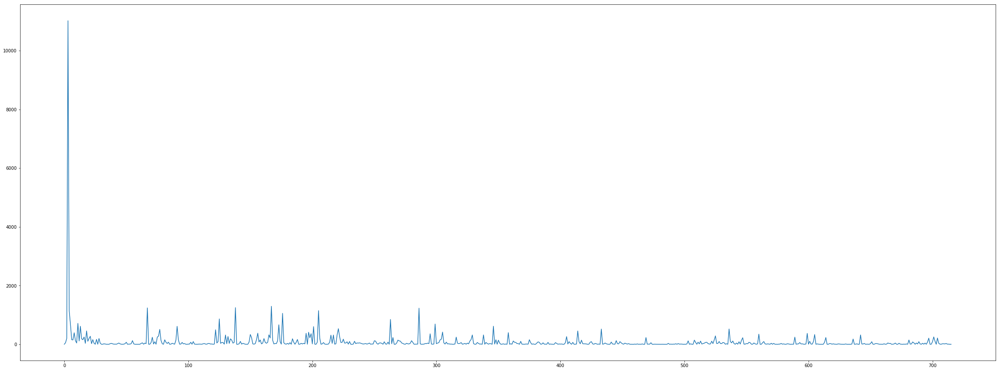

ACF plot


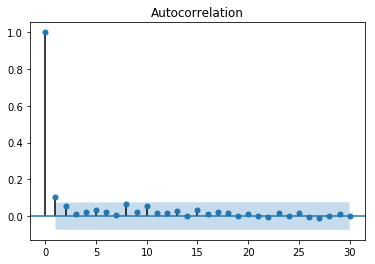


****************************
Data for  BNB-USD
****************************

Variance, (assuming a zero mean)


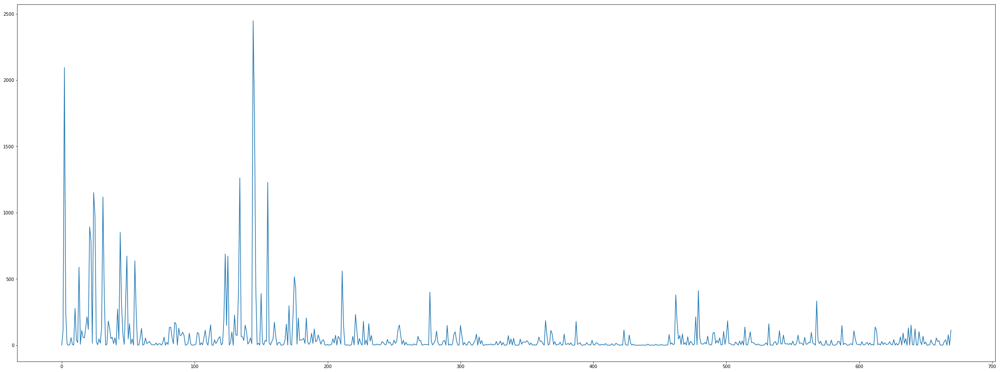

ACF plot


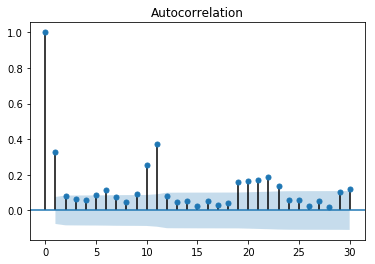


****************************
Data for  XLM-USD
****************************

Variance, (assuming a zero mean)


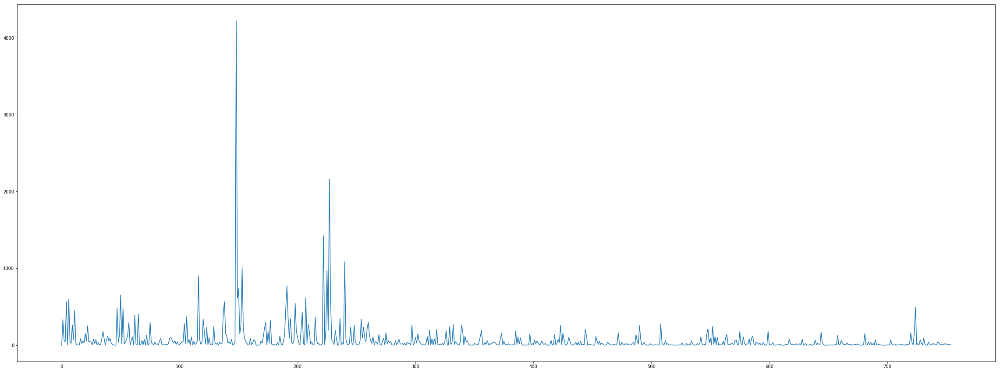

ACF plot


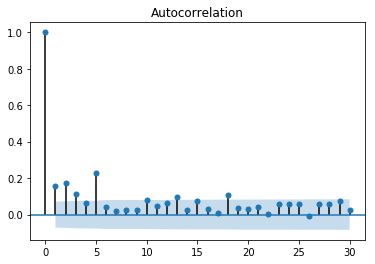


****************************
Data for  ADA-USD
****************************

Variance, (assuming a zero mean)


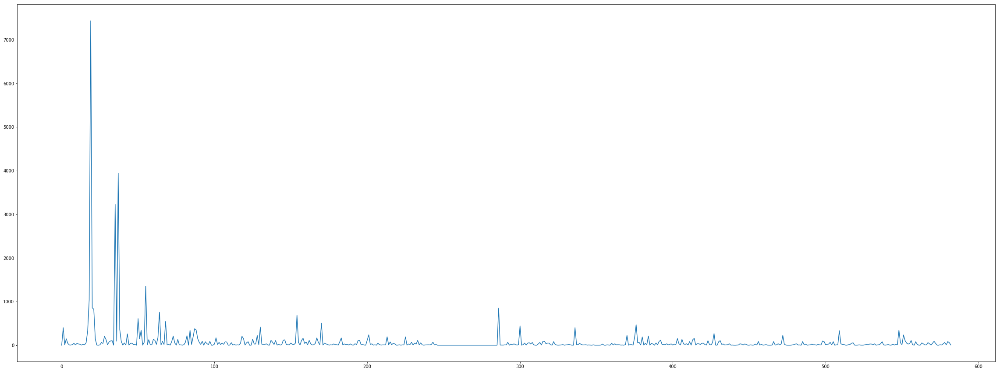

ACF plot


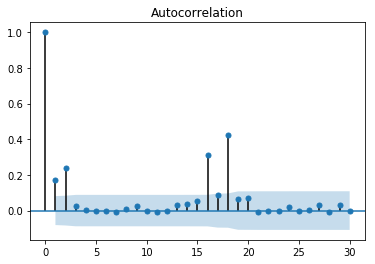


****************************
Data for  TRX-USD
****************************

Variance, (assuming a zero mean)


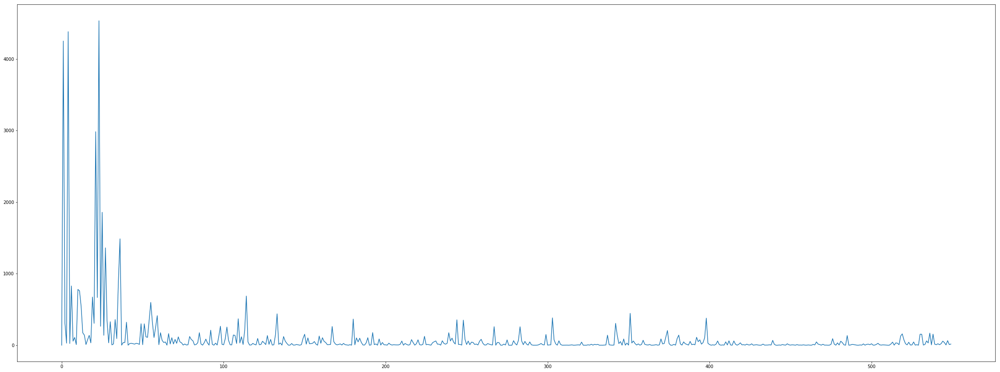

ACF plot


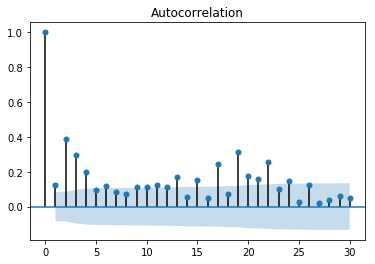


****************************
Data for  XMR-USD
****************************

Variance, (assuming a zero mean)


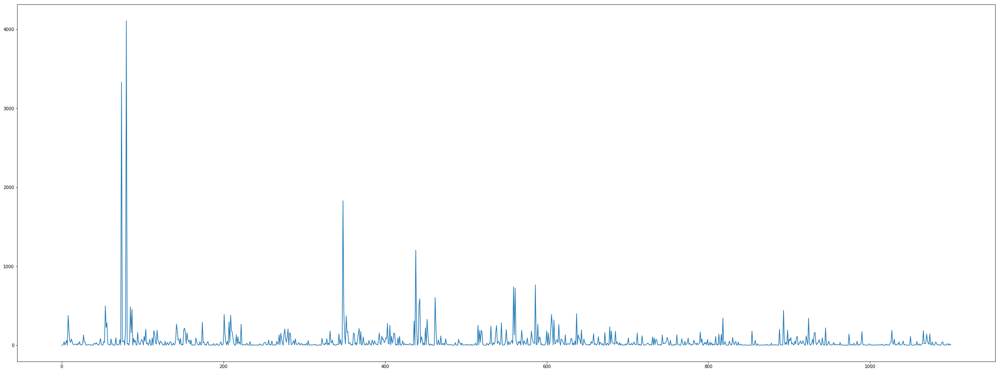

ACF plot


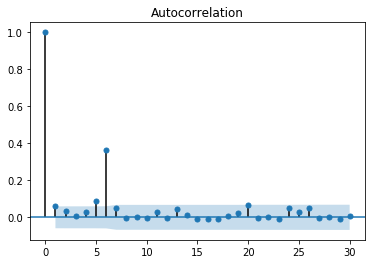

In [17]:
for c in cryptos:
    var_and_acf(c)

## GARCH models
We chose the p and q depending on the numebr of significantly correlated lags in the ACF plot


****************************
Data for  BTC-USD
****************************

Iteration:      1,   Func. Count:     17,   Neg. LLF: 6181.420179080391
Iteration:      2,   Func. Count:     35,   Neg. LLF: 6098.761556465592
Iteration:      3,   Func. Count:     54,   Neg. LLF: 6090.765958556945
Iteration:      4,   Func. Count:     72,   Neg. LLF: 6074.639980647902
Iteration:      5,   Func. Count:     90,   Neg. LLF: 6050.492802206912
Iteration:      6,   Func. Count:    108,   Neg. LLF: 6047.056192093864
Iteration:      7,   Func. Count:    126,   Neg. LLF: 6039.4380898159225
Iteration:      8,   Func. Count:    145,   Neg. LLF: 6039.101154592125
Iteration:      9,   Func. Count:    163,   Neg. LLF: 6037.226059415422
Iteration:     10,   Func. Count:    181,   Neg. LLF: 6035.994848426375
Iteration:     11,   Func. Count:    199,   Neg. LLF: 6035.609343423904
Iteration:     12,   Func. Count:    217,   Neg. LLF: 6035.426800377199
Iteration:     13,   Func. Count:    236,   Neg. LLF: 603

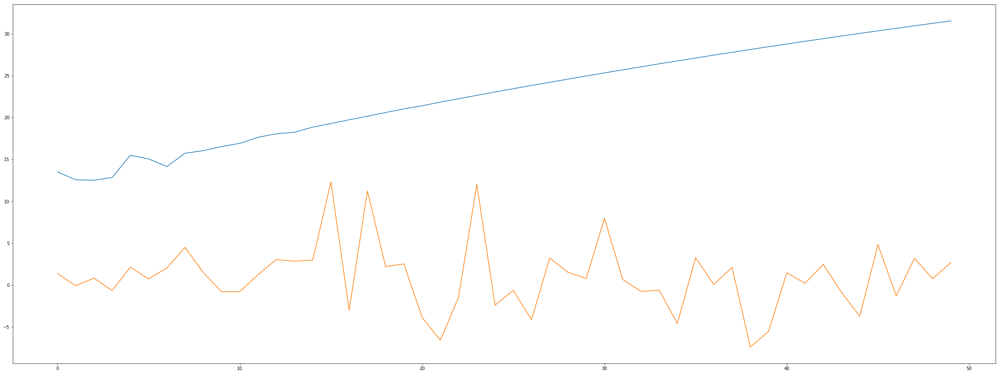


****************************
Data for  ETH-USD
****************************

Iteration:      1,   Func. Count:     25,   Neg. LLF: 3671.7407673517782
Iteration:      2,   Func. Count:     51,   Neg. LLF: 3634.783311687977
Iteration:      3,   Func. Count:     77,   Neg. LLF: 3625.684103892855
Iteration:      4,   Func. Count:    104,   Neg. LLF: 3624.315491430588
Iteration:      5,   Func. Count:    130,   Neg. LLF: 3623.6640841354706
Iteration:      6,   Func. Count:    157,   Neg. LLF: 3623.280443512452
Iteration:      7,   Func. Count:    183,   Neg. LLF: 3621.852617451469
Iteration:      8,   Func. Count:    210,   Neg. LLF: 3621.6025566622934
Iteration:      9,   Func. Count:    236,   Neg. LLF: 3621.1407129850436
Iteration:     10,   Func. Count:    262,   Neg. LLF: 3620.745624982905
Iteration:     11,   Func. Count:    289,   Neg. LLF: 3620.705593823136
Iteration:     12,   Func. Count:    315,   Neg. LLF: 3620.427150467916
Iteration:     13,   Func. Count:    341,   Neg. LLF: 

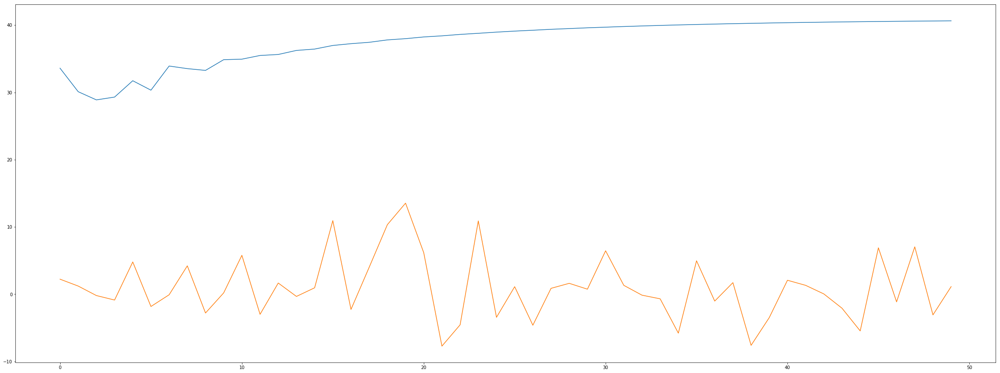


****************************
Data for  XRP-USD
****************************

Iteration:      1,   Func. Count:     23,   Neg. LLF: 5503.047431482901
Iteration:      2,   Func. Count:     47,   Neg. LLF: 5436.447824862086
Iteration:      3,   Func. Count:     73,   Neg. LLF: 5427.606738953955
Iteration:      4,   Func. Count:     98,   Neg. LLF: 5424.542699752334
Iteration:      5,   Func. Count:    122,   Neg. LLF: 5412.835262588143
Iteration:      6,   Func. Count:    146,   Neg. LLF: 5407.188560278618
Iteration:      7,   Func. Count:    170,   Neg. LLF: 5403.009555530827
Iteration:      8,   Func. Count:    194,   Neg. LLF: 5390.186291375019
Iteration:      9,   Func. Count:    218,   Neg. LLF: 5386.278876276726
Iteration:     10,   Func. Count:    242,   Neg. LLF: 5375.191912448491
Iteration:     11,   Func. Count:    266,   Neg. LLF: 5372.491061496549
Iteration:     12,   Func. Count:    290,   Neg. LLF: 5371.452172724857
Iteration:     13,   Func. Count:    314,   Neg. LLF: 5369

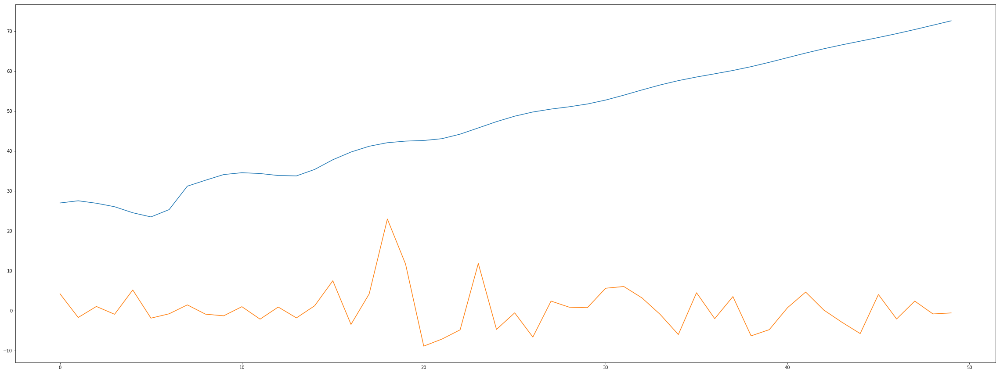


****************************
Data for  LTC-USD
****************************

Iteration:      1,   Func. Count:      5,   Neg. LLF: 6283.140066093705
Iteration:      2,   Func. Count:     14,   Neg. LLF: 6275.1058761059685
Iteration:      3,   Func. Count:     21,   Neg. LLF: 6275.002570429757
Iteration:      4,   Func. Count:     27,   Neg. LLF: 6274.358596040241
Iteration:      5,   Func. Count:     35,   Neg. LLF: 6274.358167840785
Iteration:      6,   Func. Count:     40,   Neg. LLF: 6274.350762723943
Iteration:      7,   Func. Count:     45,   Neg. LLF: 6274.3486574140115
Optimization terminated successfully.    (Exit mode 0)
            Current function value: 6274.348656517865
            Iterations: 7
            Function evaluations: 46
            Gradient evaluations: 7
<bound method ARCHModelResult.summary of                        Zero Mean - GARCH Model Results                        
Dep. Variable:                Returns   R-squared:                       0.000
Mean Mode

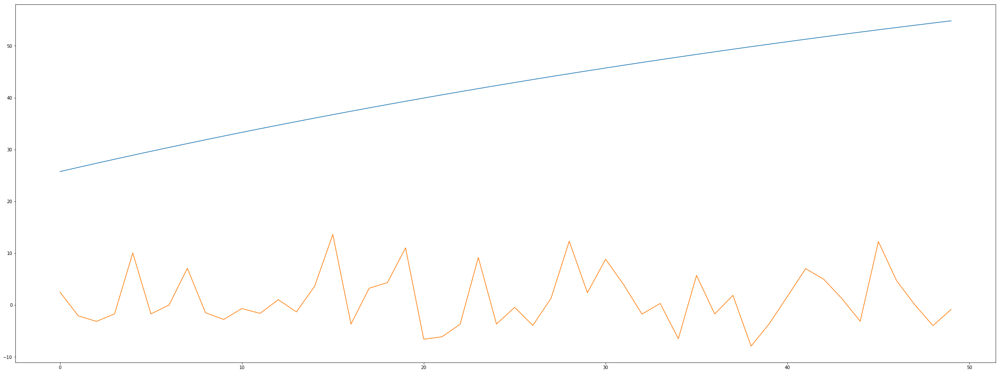


****************************
Data for  BCH-USD
****************************

Iteration:      1,   Func. Count:     17,   Neg. LLF: 2223.5909809124523
Iteration:      2,   Func. Count:     35,   Neg. LLF: 2218.277845573096
Iteration:      3,   Func. Count:     53,   Neg. LLF: 2216.6588616631707
Iteration:      4,   Func. Count:     71,   Neg. LLF: 2214.4221979148497
Iteration:      5,   Func. Count:     89,   Neg. LLF: 2209.7950377343977
Iteration:      6,   Func. Count:    106,   Neg. LLF: 2208.0943306550325
Iteration:      7,   Func. Count:    124,   Neg. LLF: 2207.548657818542
Iteration:      8,   Func. Count:    143,   Neg. LLF: 2206.6545231653276
Iteration:      9,   Func. Count:    161,   Neg. LLF: 2205.7924875493845
Iteration:     10,   Func. Count:    178,   Neg. LLF: 2204.6362616475044
Iteration:     11,   Func. Count:    196,   Neg. LLF: 2204.333189251928
Iteration:     12,   Func. Count:    214,   Neg. LLF: 2204.0223706728943
Iteration:     13,   Func. Count:    232,   Neg. 

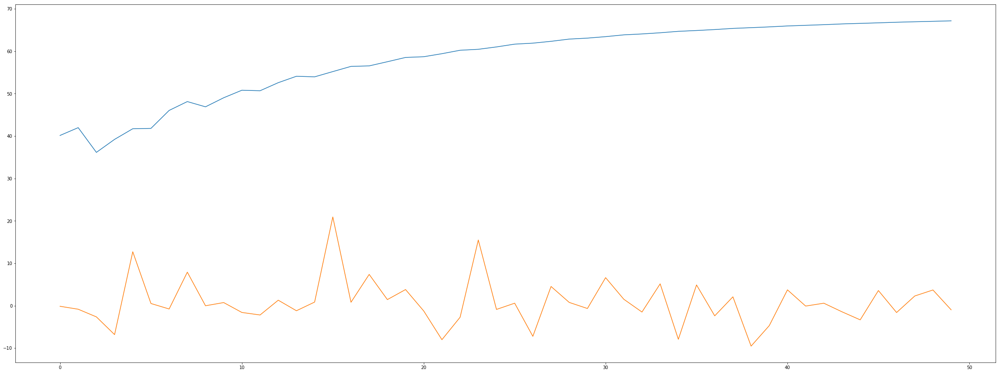


****************************
Data for  EOS-USD
****************************

Iteration:      1,   Func. Count:      7,   Neg. LLF: 2350.1762621252706
Iteration:      2,   Func. Count:     16,   Neg. LLF: 2350.136939958857
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2347.628972782093
Iteration:      4,   Func. Count:     32,   Neg. LLF: 2343.902107379939
Iteration:      5,   Func. Count:     40,   Neg. LLF: 2342.6504926309844
Iteration:      6,   Func. Count:     48,   Neg. LLF: 2342.218026810362
Iteration:      7,   Func. Count:     56,   Neg. LLF: 2342.0633386805125
Iteration:      8,   Func. Count:     64,   Neg. LLF: 2341.8877726610435
Iteration:      9,   Func. Count:     72,   Neg. LLF: 2341.8347483625794
Iteration:     10,   Func. Count:     80,   Neg. LLF: 2341.7919679676147
Iteration:     11,   Func. Count:     88,   Neg. LLF: 2341.778209714429
Iteration:     12,   Func. Count:     96,   Neg. LLF: 2341.772134309869
Iteration:     13,   Func. Count:    103,   Neg. LLF

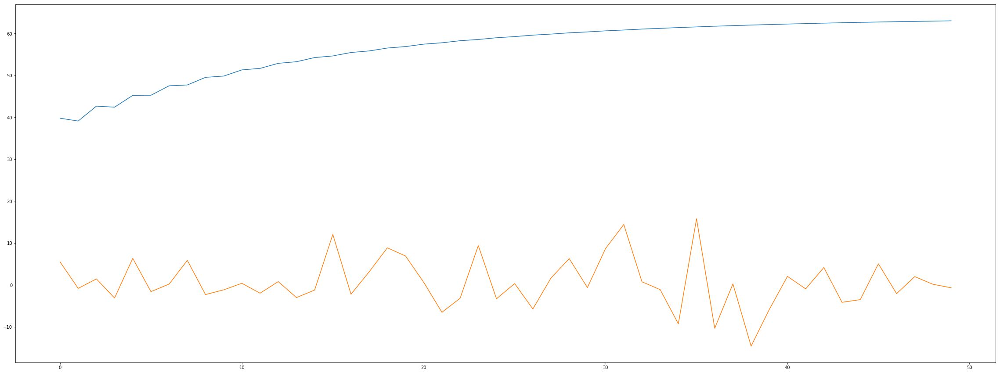


****************************
Data for  BNB-USD
****************************

Iteration:      1,   Func. Count:     49,   Neg. LLF: 2097.4078849885336
Iteration:      2,   Func. Count:     99,   Neg. LLF: 2093.1889436532956
Iteration:      3,   Func. Count:    149,   Neg. LLF: 2083.3201153362374
Iteration:      4,   Func. Count:    203,   Neg. LLF: 2069.7050282099026
Iteration:      5,   Func. Count:    253,   Neg. LLF: 2063.6958176582652
Iteration:      6,   Func. Count:    303,   Neg. LLF: 2059.922616526371
Iteration:      7,   Func. Count:    354,   Neg. LLF: 2059.101427784885
Iteration:      8,   Func. Count:    405,   Neg. LLF: 2058.4215755149235
Iteration:      9,   Func. Count:    455,   Neg. LLF: 2056.504601575112
Iteration:     10,   Func. Count:    505,   Neg. LLF: 2054.602040762117
Iteration:     11,   Func. Count:    555,   Neg. LLF: 2053.6974468012913
Iteration:     12,   Func. Count:    605,   Neg. LLF: 2052.655403203382
Iteration:     13,   Func. Count:    656,   Neg. LL

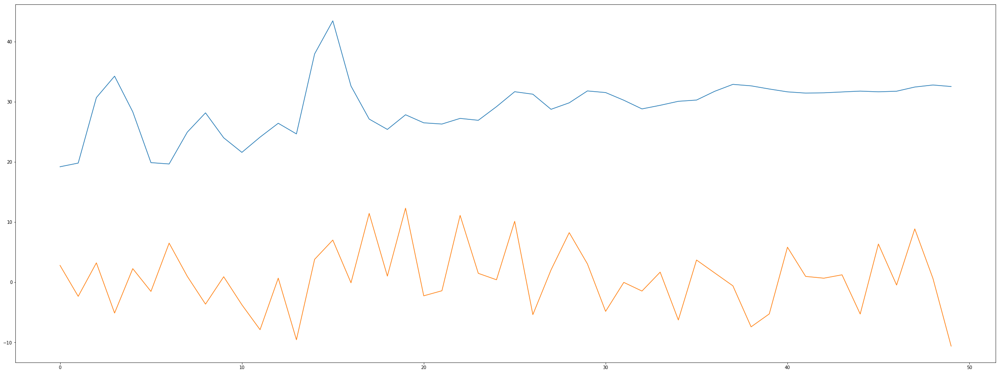


****************************
Data for  XLM-USD
****************************

Iteration:      1,   Func. Count:     13,   Neg. LLF: 2427.1484025072527
Iteration:      2,   Func. Count:     27,   Neg. LLF: 2426.2118416062267
Iteration:      3,   Func. Count:     41,   Neg. LLF: 2425.7011037386383
Iteration:      4,   Func. Count:     55,   Neg. LLF: 2425.2500093242734
Iteration:      5,   Func. Count:     69,   Neg. LLF: 2424.5446082736
Iteration:      6,   Func. Count:     84,   Neg. LLF: 2424.416504252731
Iteration:      7,   Func. Count:     98,   Neg. LLF: 2423.671007539513
Iteration:      8,   Func. Count:    113,   Neg. LLF: 2423.288440418282
Iteration:      9,   Func. Count:    127,   Neg. LLF: 2423.0016355153457
Iteration:     10,   Func. Count:    141,   Neg. LLF: 2422.527168078791
Iteration:     11,   Func. Count:    155,   Neg. LLF: 2422.1332536339664
Iteration:     12,   Func. Count:    169,   Neg. LLF: 2421.879713900663
Iteration:     13,   Func. Count:    183,   Neg. LLF: 

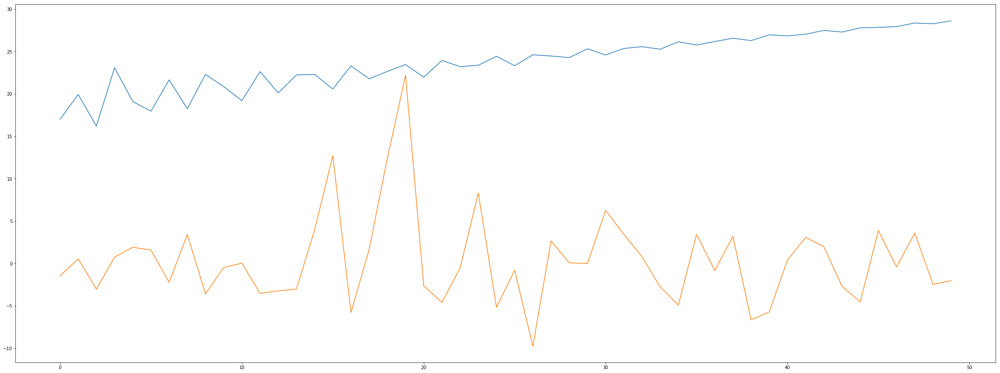


****************************
Data for  ADA-USD
****************************

Iteration:      1,   Func. Count:      7,   Neg. LLF: 1826.7957873373894
Iteration:      2,   Func. Count:     16,   Neg. LLF: 1820.1489948317017
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1818.972306452431
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1811.1707550059919
Iteration:      5,   Func. Count:     39,   Neg. LLF: 1809.712885023097
Iteration:      6,   Func. Count:     51,   Neg. LLF: 1808.97018321805
Iteration:      7,   Func. Count:     62,   Neg. LLF: 1808.1957140573084
Iteration:      8,   Func. Count:     70,   Neg. LLF: 1807.693288606994
Iteration:      9,   Func. Count:     78,   Neg. LLF: 1807.2189578007687
Iteration:     10,   Func. Count:     86,   Neg. LLF: 1806.5269888683324
Iteration:     11,   Func. Count:     93,   Neg. LLF: 1806.3973161257618
Iteration:     12,   Func. Count:    100,   Neg. LLF: 1806.3788526336139
Iteration:     13,   Func. Count:    107,   Neg. LL

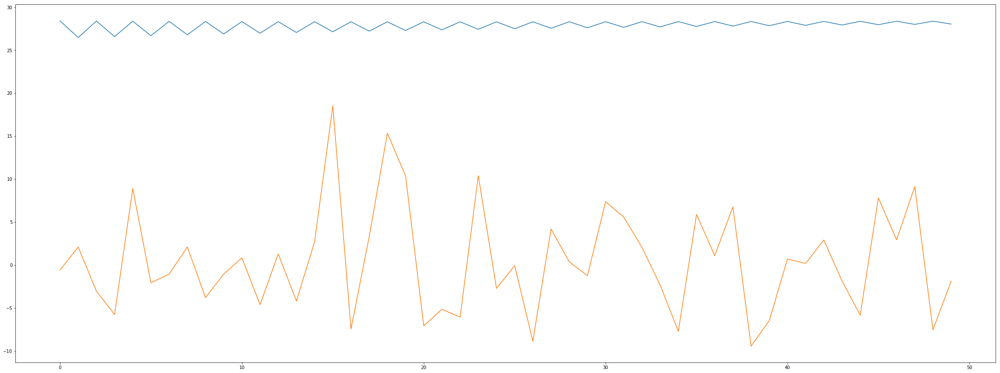


****************************
Data for  TRX-USD
****************************

Iteration:      1,   Func. Count:     55,   Neg. LLF: 1739.5723187184387
Iteration:      2,   Func. Count:    111,   Neg. LLF: 1703.060784414232
Iteration:      3,   Func. Count:    167,   Neg. LLF: 1693.254254591773
Iteration:      4,   Func. Count:    223,   Neg. LLF: 1682.9280124981005
Iteration:      5,   Func. Count:    279,   Neg. LLF: 1680.7296517495515
Iteration:      6,   Func. Count:    335,   Neg. LLF: 1675.1779864097284
Iteration:      7,   Func. Count:    391,   Neg. LLF: 1673.066161217036
Iteration:      8,   Func. Count:    447,   Neg. LLF: 1670.5974839360956
Iteration:      9,   Func. Count:    503,   Neg. LLF: 1670.0688727103188
Iteration:     10,   Func. Count:    559,   Neg. LLF: 1669.0702202378259
Iteration:     11,   Func. Count:    615,   Neg. LLF: 1667.9445262722754
Iteration:     12,   Func. Count:    671,   Neg. LLF: 1667.0433865737077
Iteration:     13,   Func. Count:    727,   Neg. 

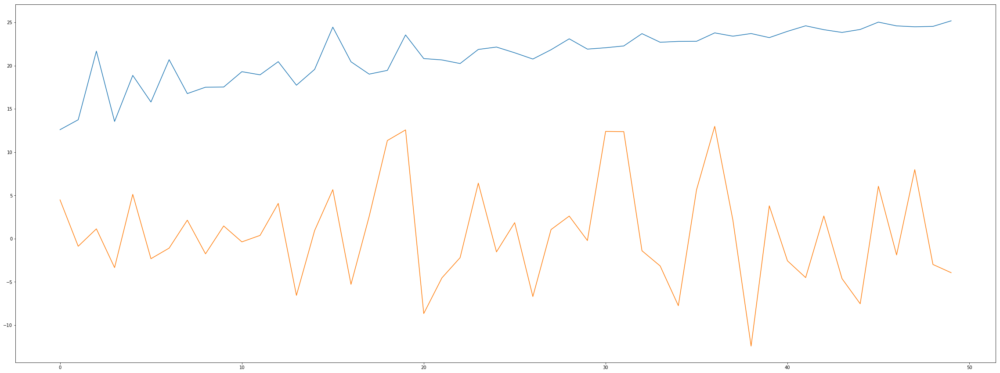


****************************
Data for  XMR-USD
****************************

Iteration:      1,   Func. Count:     15,   Neg. LLF: 3519.2782988283175
Iteration:      2,   Func. Count:     31,   Neg. LLF: 3508.5123822877954
Iteration:      3,   Func. Count:     48,   Neg. LLF: 3507.067334068737
Iteration:      4,   Func. Count:     64,   Neg. LLF: 3505.837218258597
Iteration:      5,   Func. Count:     81,   Neg. LLF: 3505.3670324570703
Iteration:      6,   Func. Count:     97,   Neg. LLF: 3503.843064162967
Iteration:      7,   Func. Count:    113,   Neg. LLF: 3497.6991354689744
Iteration:      8,   Func. Count:    129,   Neg. LLF: 3497.2584847046346
Iteration:      9,   Func. Count:    145,   Neg. LLF: 3496.4296603351672
Iteration:     10,   Func. Count:    161,   Neg. LLF: 3495.1607600145708
Iteration:     11,   Func. Count:    178,   Neg. LLF: 3495.0482841797357
Iteration:     12,   Func. Count:    194,   Neg. LLF: 3494.5985977545943
Iteration:     13,   Func. Count:    211,   Neg. 

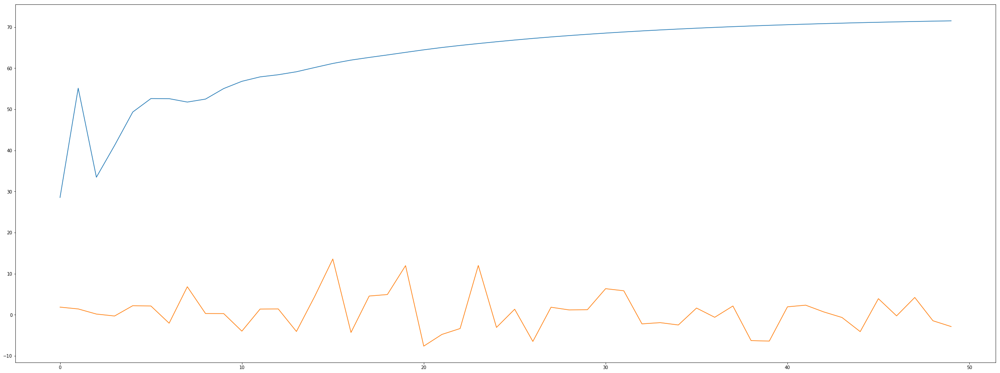

In [18]:
pq = [(7,7),(11,11),(10,10),(1,1),(7,7),(2,2),(23,23),(5,5),(2,2),(26,26),(6,6)]

for i in range(0,len(pq)):
    GARCH(cryptos[i],pq[i][0],pq[i][1])

## Comment

The GARCH model does not seem to sucseed in modeling the volitility, the R squared is very low. This is probably due to a low predictability of cryptocurrencies. This implis that its am extremly riscy type of asset

# Question 8

In [19]:
def DCC(cur1,cur2):
    print('\n****************************')
    print('Data for ',cur1['ticker'][0],' and ',cur2['ticker'][0])
    print('****************************\n')
    ETH = cur1
    BTC = cur2
    mdata = pd.concat([BTC['Returns'], ETH['Returns']], axis=1)
    mdata = mdata.values
   
    mdata[:,0] = mdata[:,0]-np.mean(mdata[:,0])                       
    mdata[:,1] = mdata[:,1]-np.mean(mdata[:,1])
    T = len(mdata[:,0])
    EWMA = np.full([T,3], np.nan)
    #you can change the lambda to weight more the past variance or the past return
    lmbda = 0.94
    S = np.cov(mdata, rowvar = False)
    EWMA[0,] = S.flatten()[[0,3,1]]
    for i in range(1,T):
        S = lmbda * S + (1-lmbda) * np.transpose(np.asmatrix(mdata[i-1]))* np.asmatrix(mdata[i-1])
        EWMA[i,] = [S[0,0], S[1,1], S[0,1]]
    EWMArho = np.divide(EWMA[:,2], np.sqrt(np.multiply(EWMA[:,0],EWMA[:,1])))
    print('Evolution of the correlation over time')
    plt.figure(figsize=(40, 15))
    plt.plot(EWMArho,color='black')
    plt.show()
    
    return EWMArho


****************************
Data for  ETH-USD  and  XRP-USD
****************************

Evolution of the correlation over time


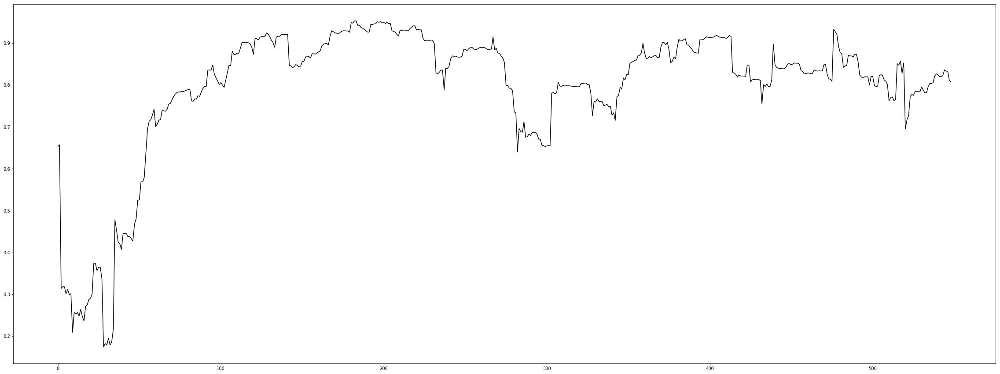


****************************
Data for  ETH-USD  and  LTC-USD
****************************

Evolution of the correlation over time


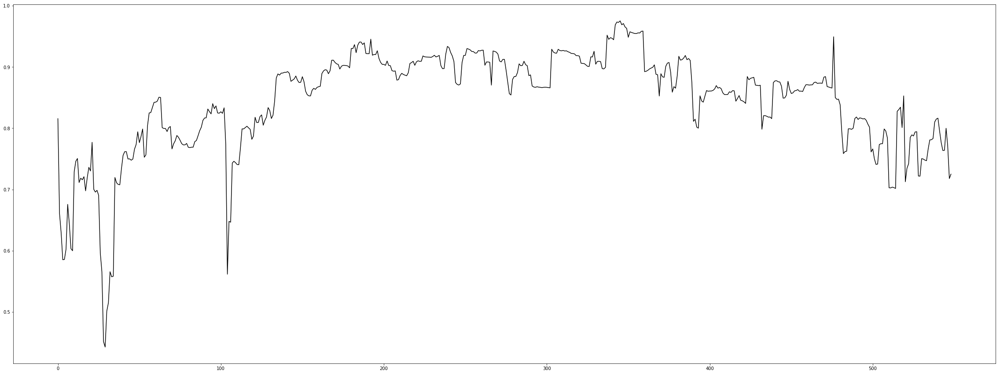


****************************
Data for  ETH-USD  and  BCH-USD
****************************

Evolution of the correlation over time


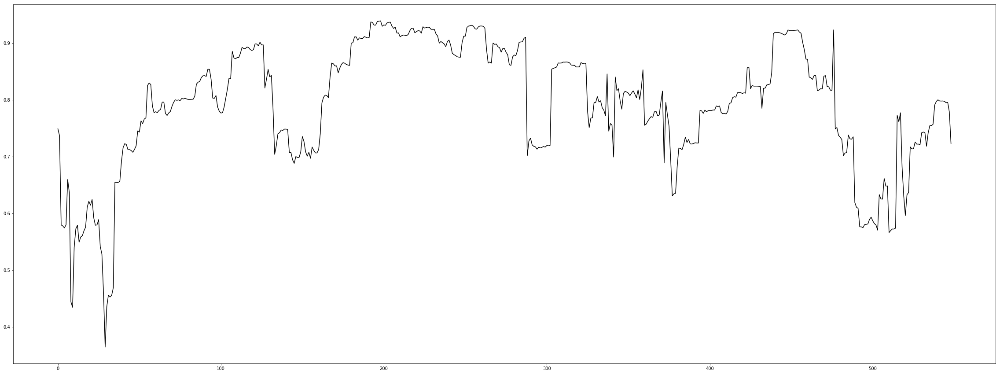


****************************
Data for  ETH-USD  and  EOS-USD
****************************

Evolution of the correlation over time


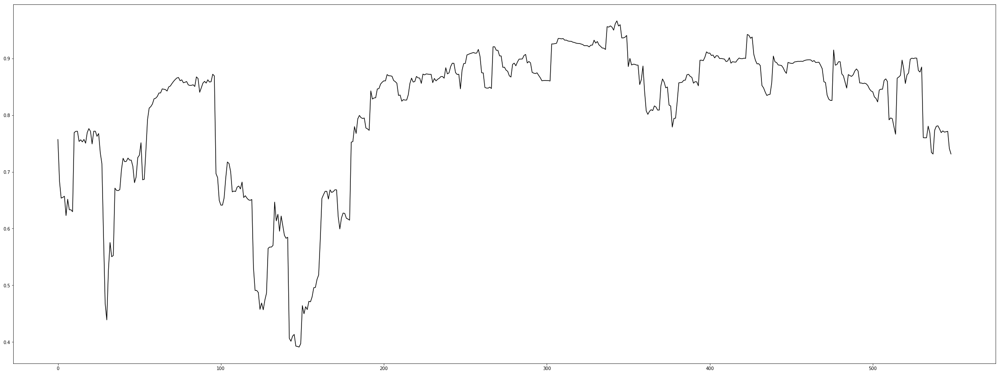


****************************
Data for  ETH-USD  and  BNB-USD
****************************

Evolution of the correlation over time


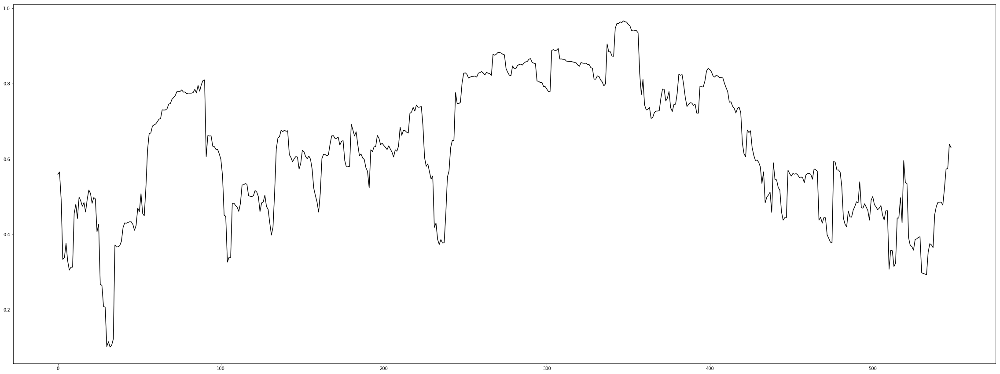


****************************
Data for  ETH-USD  and  XLM-USD
****************************

Evolution of the correlation over time


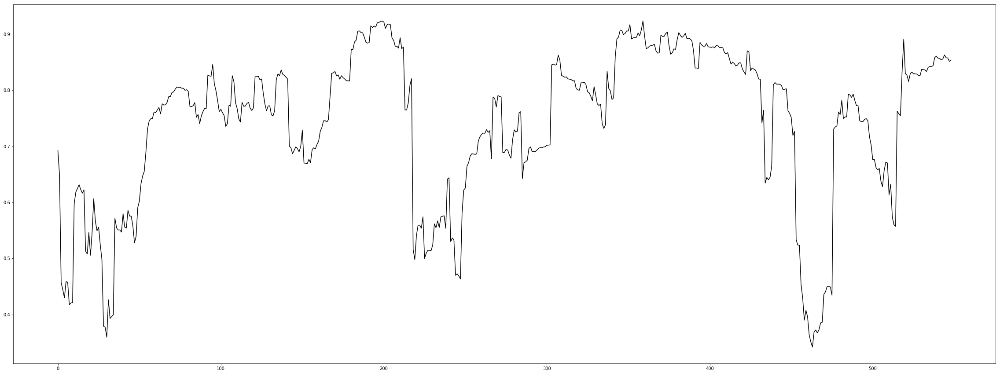


****************************
Data for  ETH-USD  and  ADA-USD
****************************

Evolution of the correlation over time


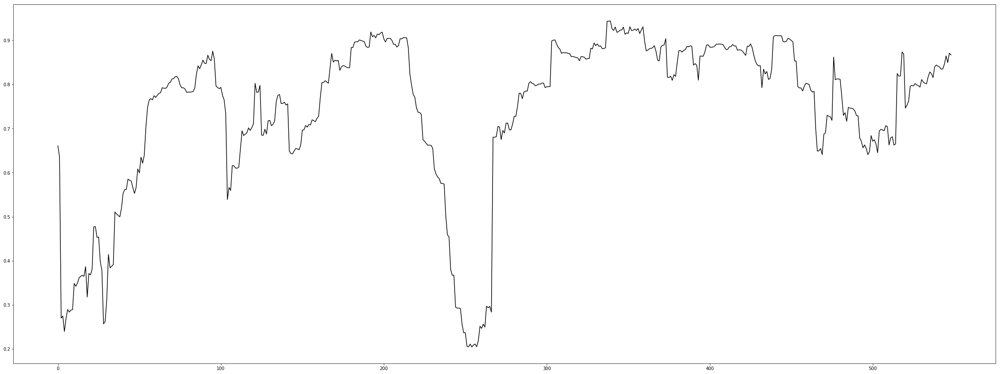


****************************
Data for  ETH-USD  and  TRX-USD
****************************

Evolution of the correlation over time


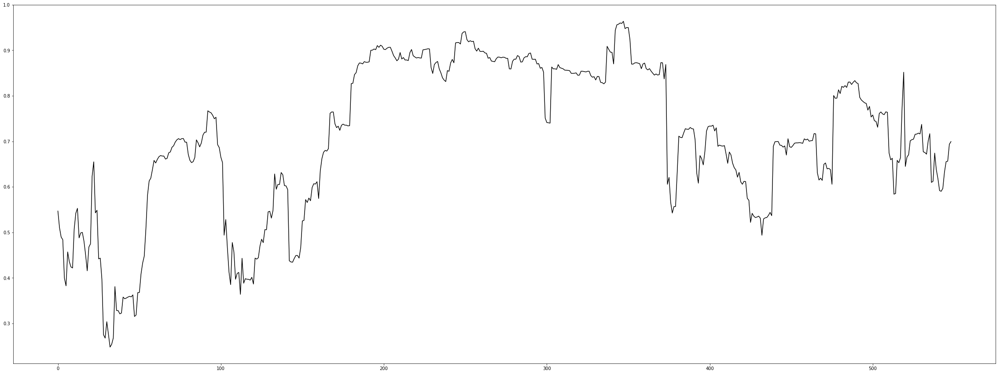


****************************
Data for  ETH-USD  and  XMR-USD
****************************

Evolution of the correlation over time


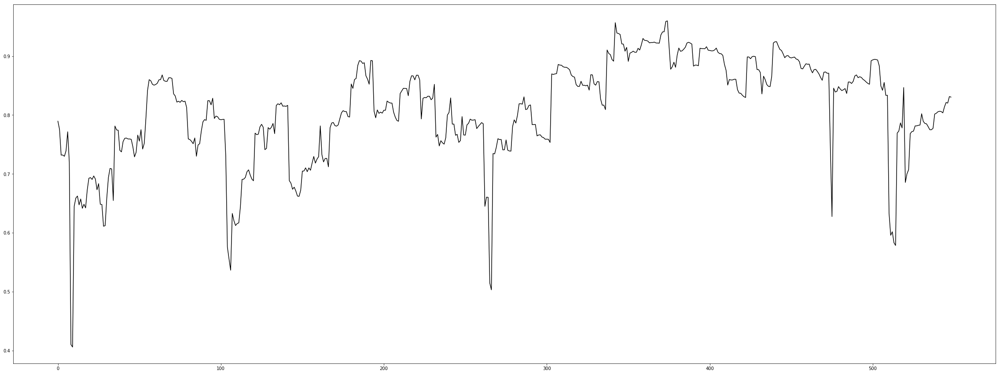


****************************
Data for  XRP-USD  and  LTC-USD
****************************

Evolution of the correlation over time


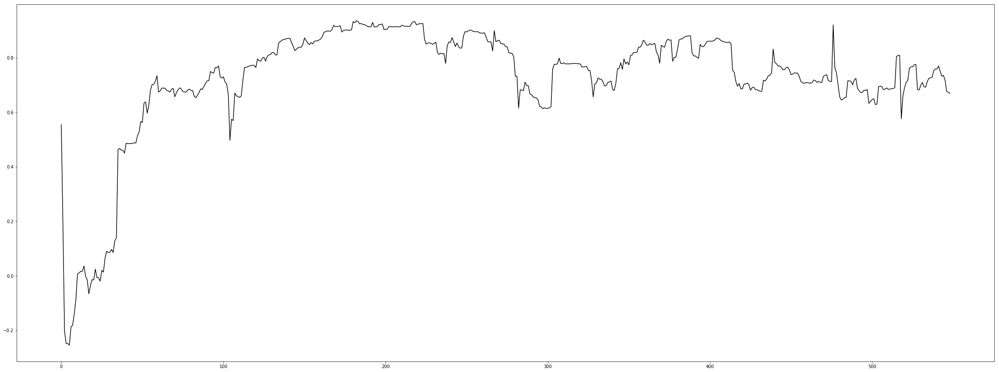


****************************
Data for  XRP-USD  and  BCH-USD
****************************

Evolution of the correlation over time


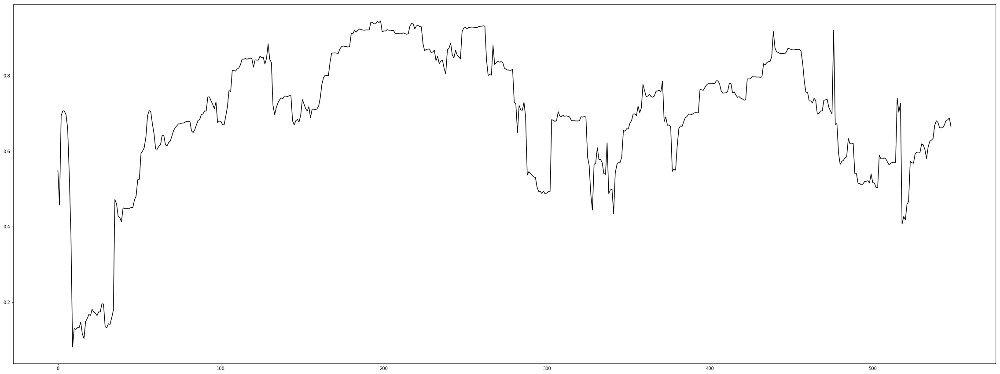


****************************
Data for  XRP-USD  and  EOS-USD
****************************

Evolution of the correlation over time


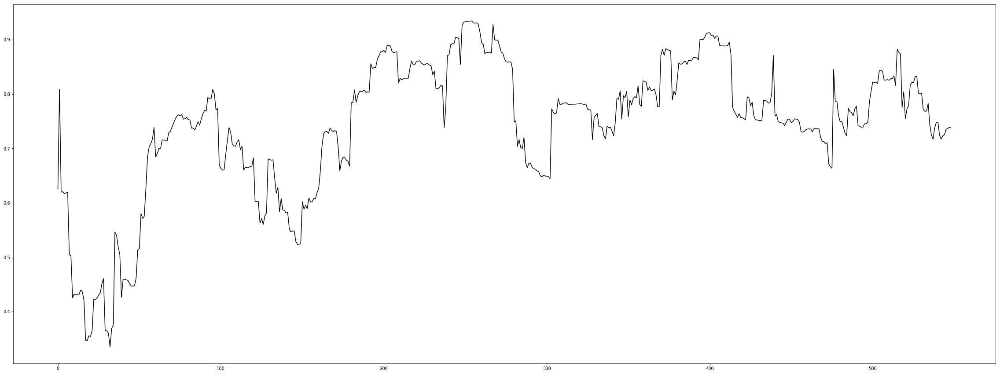


****************************
Data for  XRP-USD  and  BNB-USD
****************************

Evolution of the correlation over time


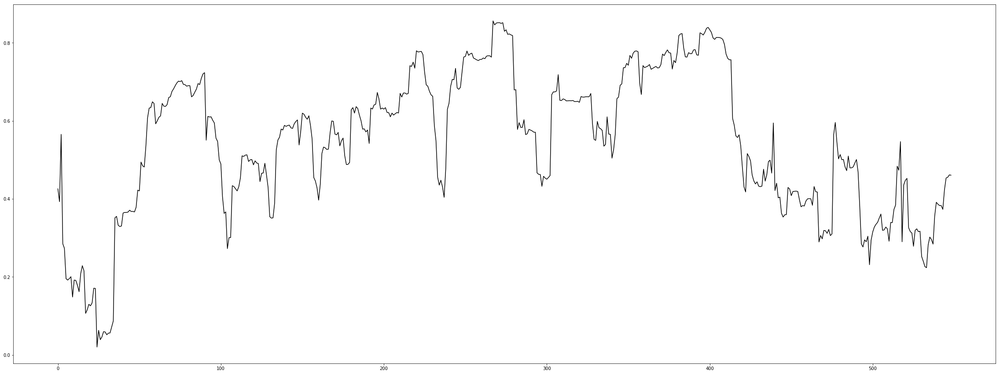


****************************
Data for  XRP-USD  and  XLM-USD
****************************

Evolution of the correlation over time


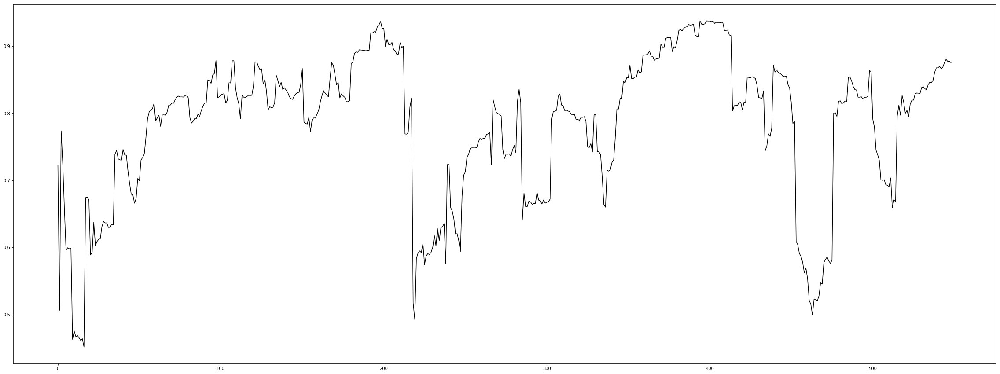


****************************
Data for  XRP-USD  and  ADA-USD
****************************

Evolution of the correlation over time


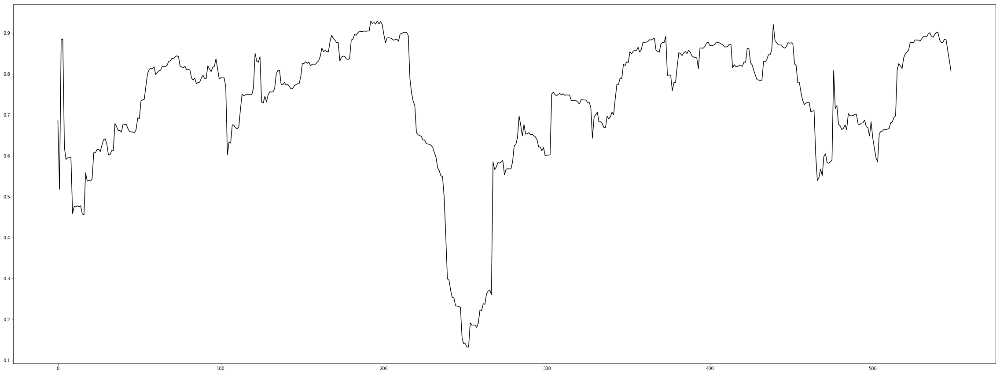


****************************
Data for  XRP-USD  and  TRX-USD
****************************

Evolution of the correlation over time


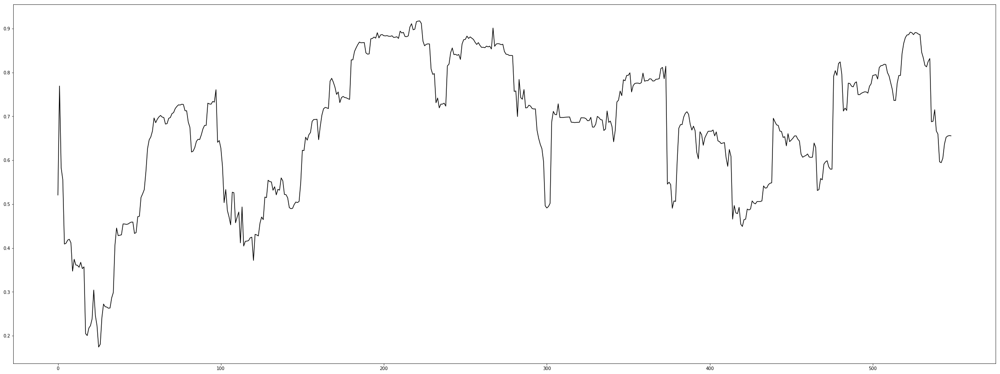


****************************
Data for  XRP-USD  and  XMR-USD
****************************

Evolution of the correlation over time


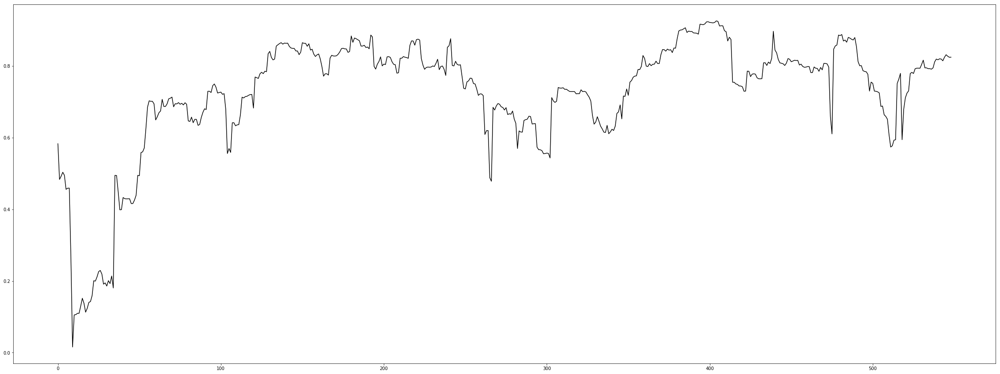


****************************
Data for  LTC-USD  and  BCH-USD
****************************

Evolution of the correlation over time


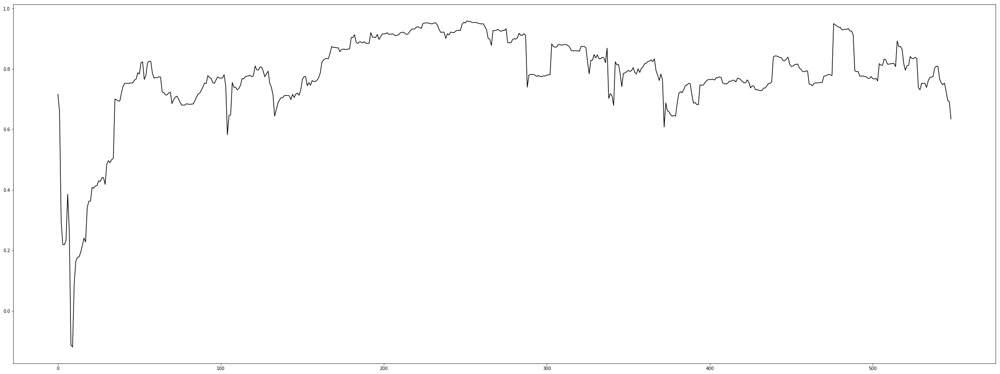


****************************
Data for  LTC-USD  and  EOS-USD
****************************

Evolution of the correlation over time


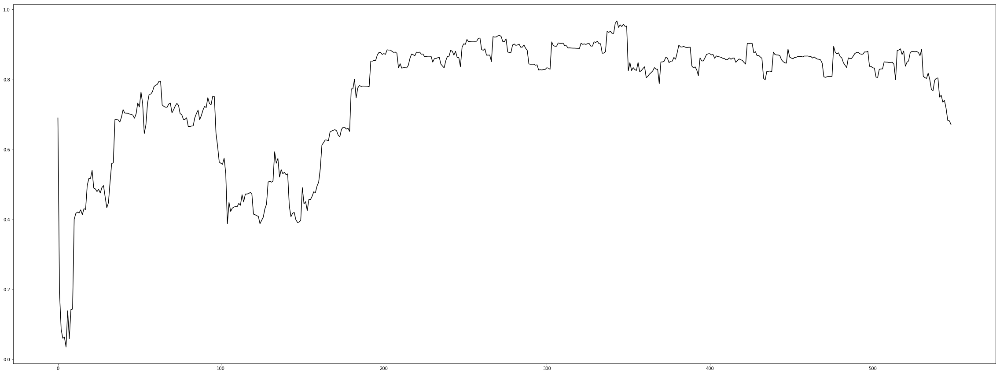


****************************
Data for  LTC-USD  and  BNB-USD
****************************

Evolution of the correlation over time


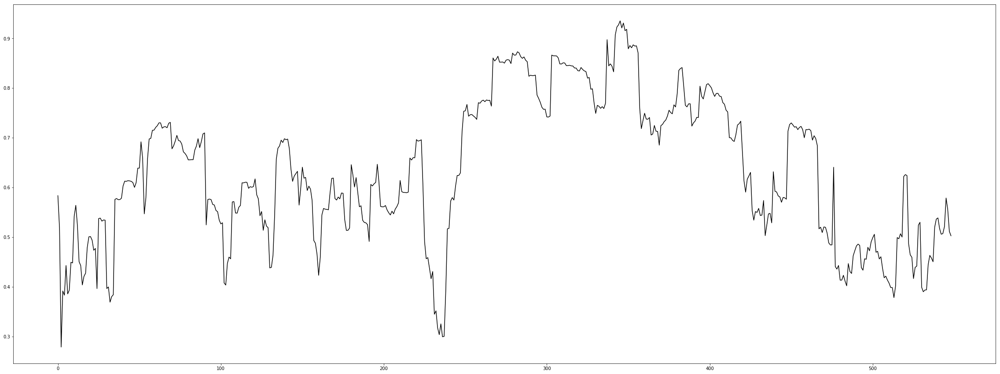


****************************
Data for  LTC-USD  and  XLM-USD
****************************

Evolution of the correlation over time


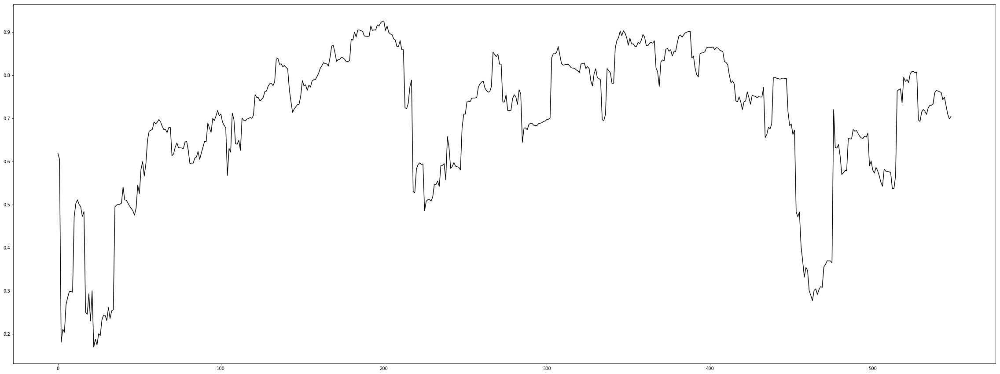


****************************
Data for  LTC-USD  and  ADA-USD
****************************

Evolution of the correlation over time


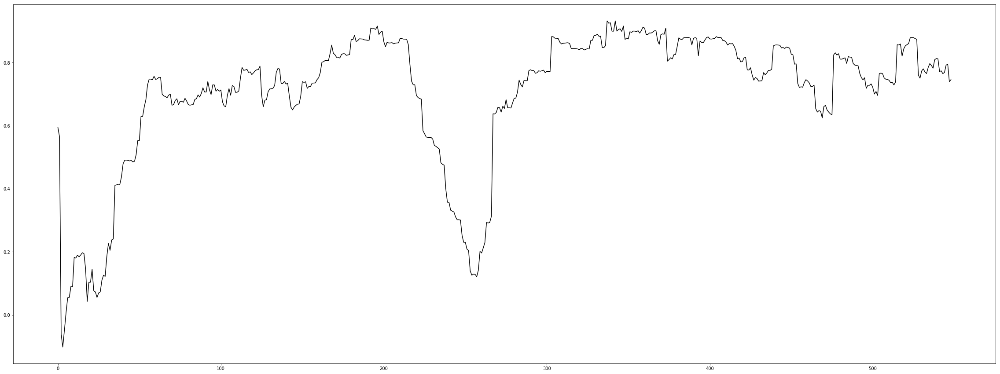


****************************
Data for  LTC-USD  and  TRX-USD
****************************

Evolution of the correlation over time


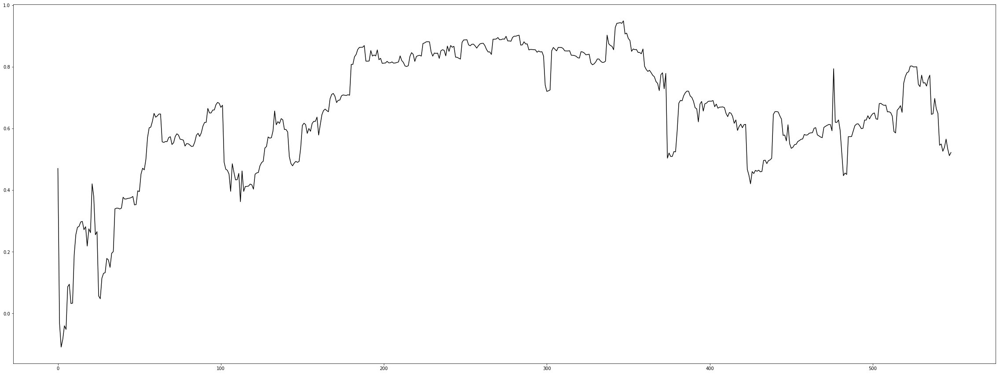


****************************
Data for  LTC-USD  and  XMR-USD
****************************

Evolution of the correlation over time


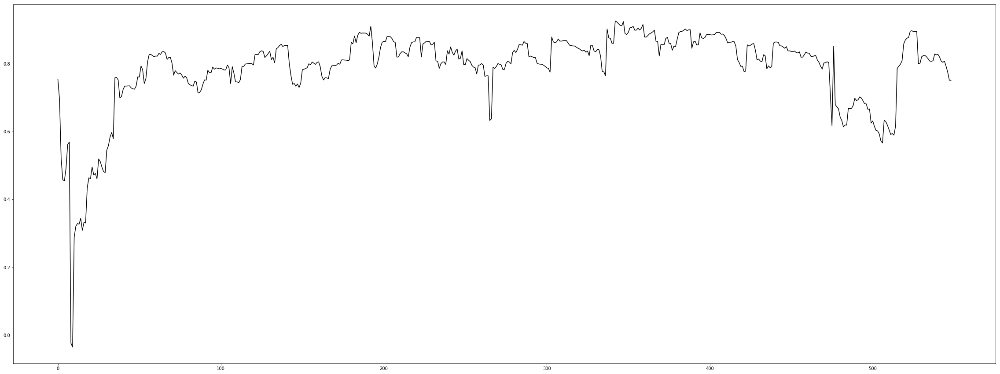


****************************
Data for  BCH-USD  and  EOS-USD
****************************

Evolution of the correlation over time


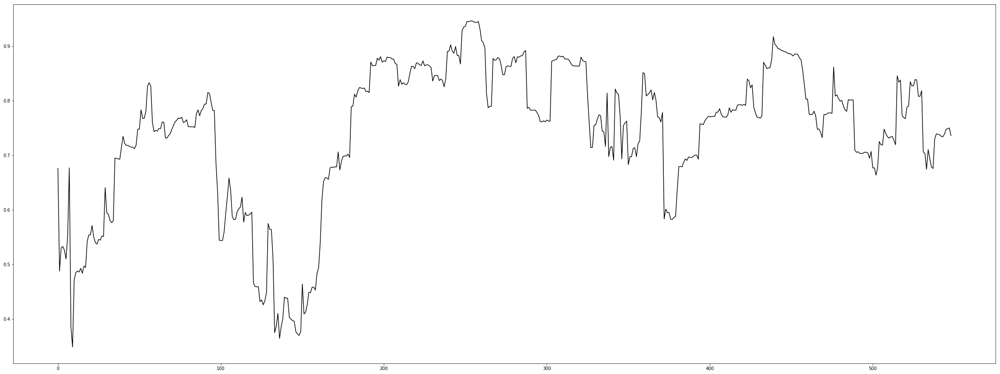


****************************
Data for  BCH-USD  and  BNB-USD
****************************

Evolution of the correlation over time


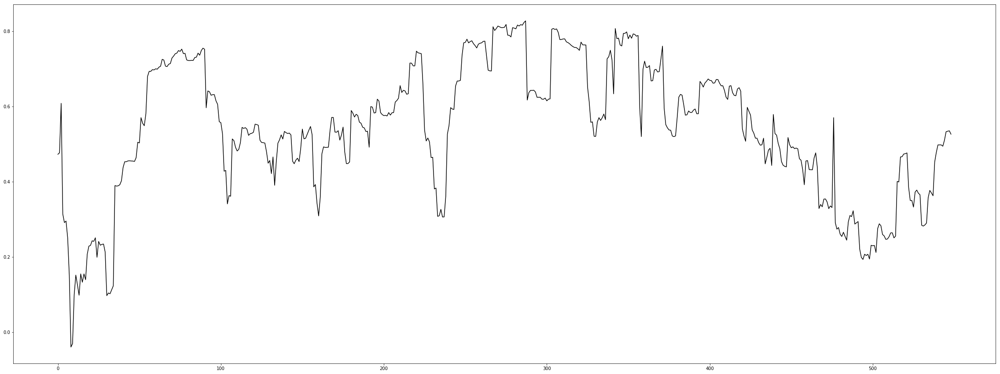


****************************
Data for  BCH-USD  and  XLM-USD
****************************

Evolution of the correlation over time


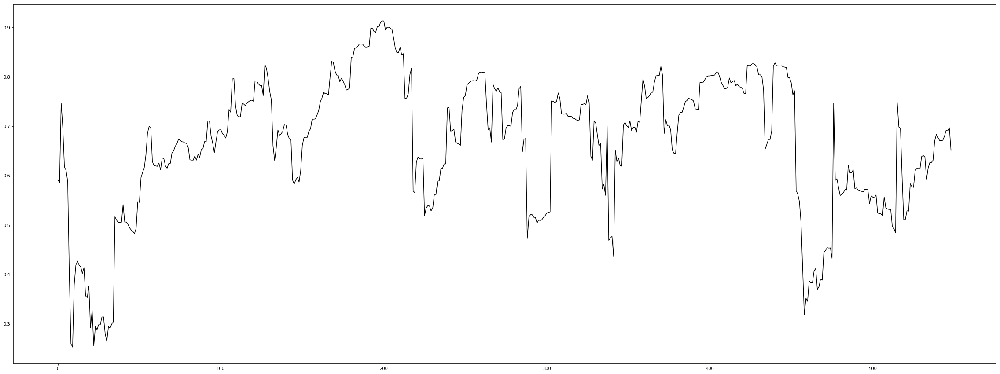


****************************
Data for  BCH-USD  and  ADA-USD
****************************

Evolution of the correlation over time


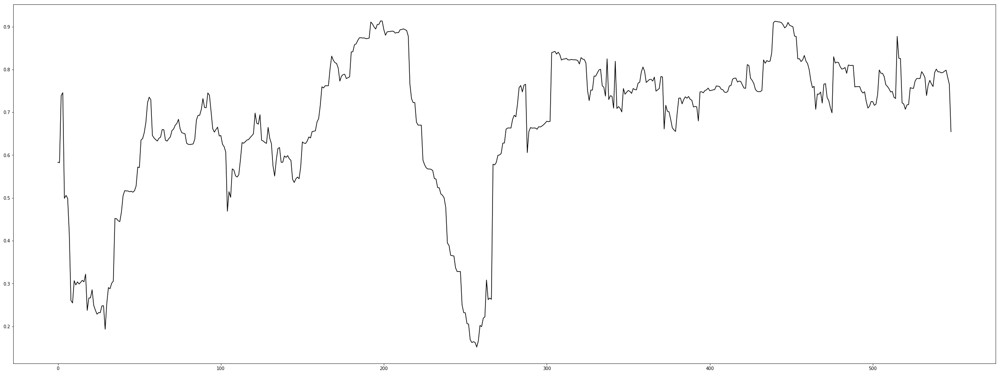


****************************
Data for  BCH-USD  and  TRX-USD
****************************

Evolution of the correlation over time


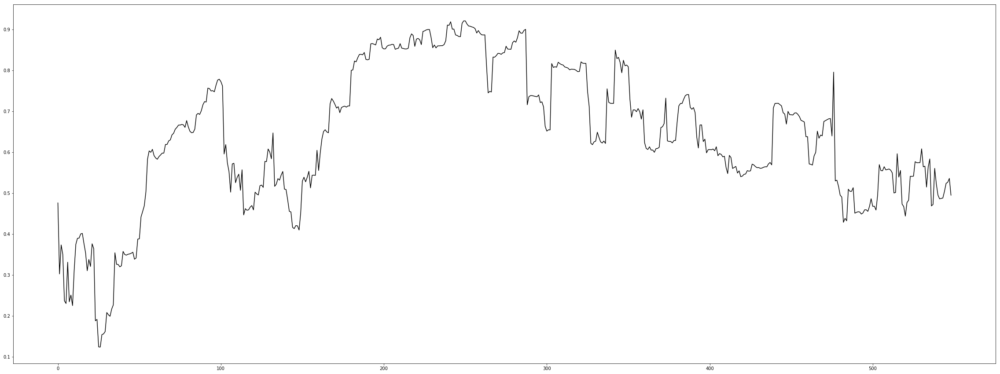


****************************
Data for  BCH-USD  and  XMR-USD
****************************

Evolution of the correlation over time


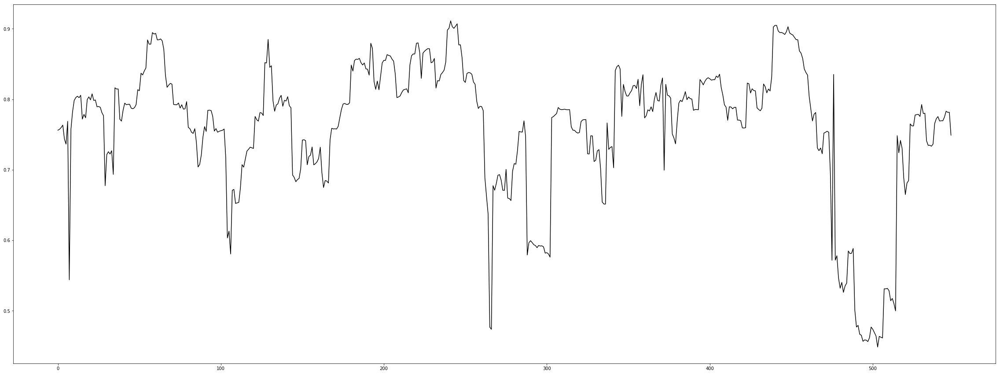


****************************
Data for  EOS-USD  and  BNB-USD
****************************

Evolution of the correlation over time


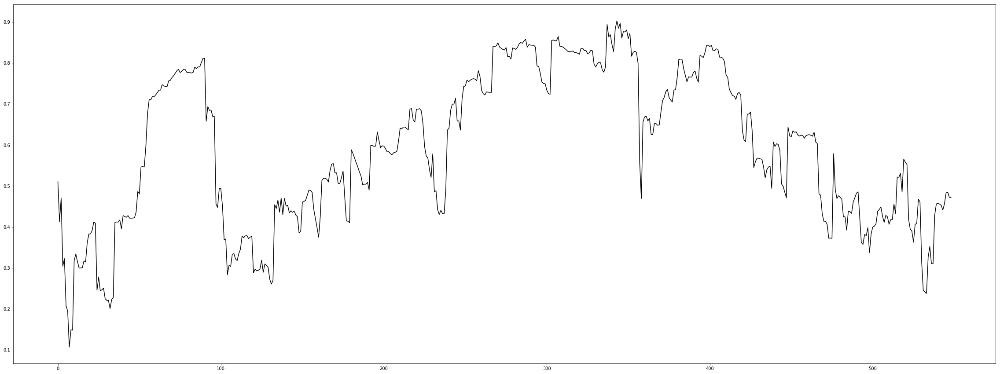


****************************
Data for  EOS-USD  and  XLM-USD
****************************

Evolution of the correlation over time


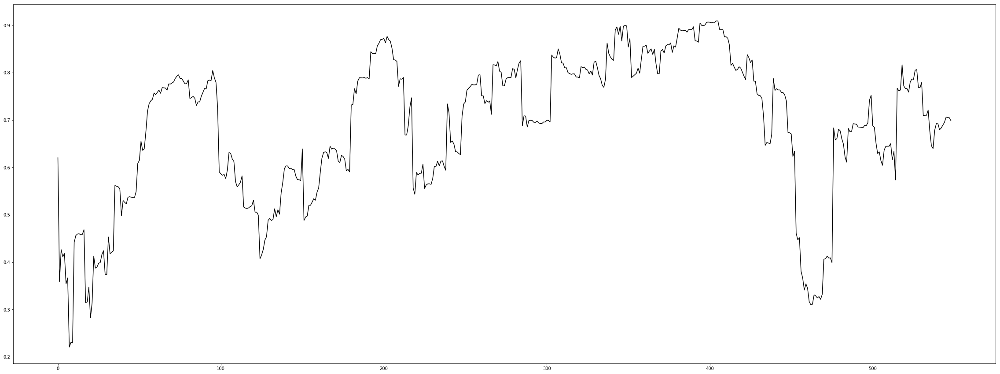


****************************
Data for  EOS-USD  and  ADA-USD
****************************

Evolution of the correlation over time


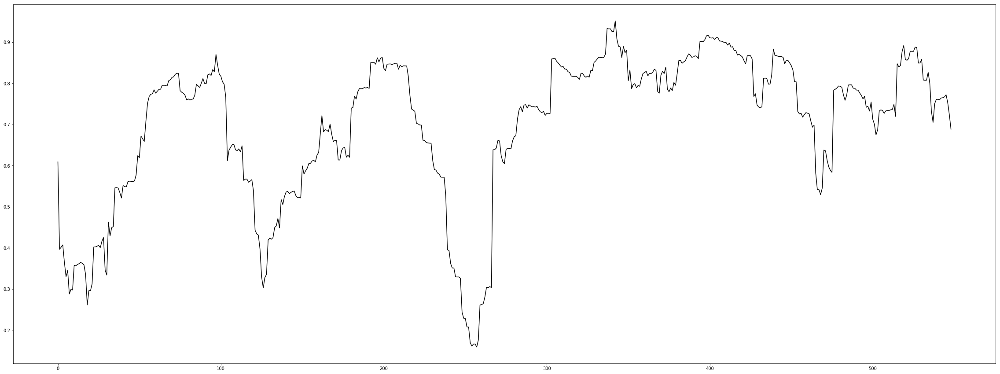


****************************
Data for  EOS-USD  and  TRX-USD
****************************

Evolution of the correlation over time


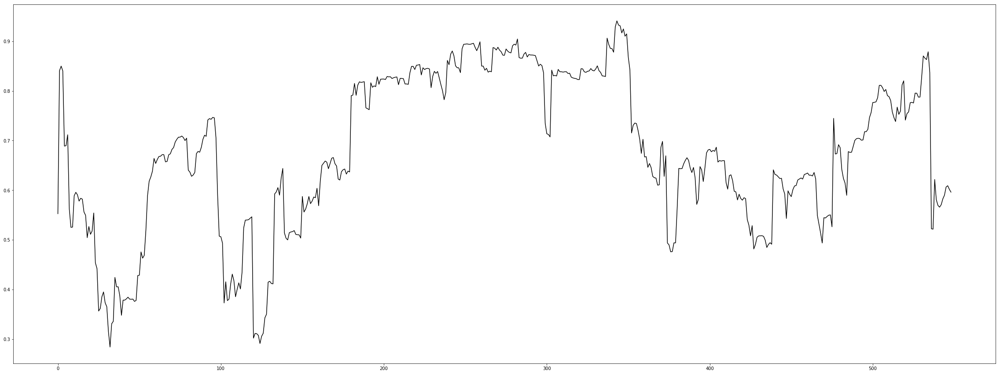


****************************
Data for  EOS-USD  and  XMR-USD
****************************

Evolution of the correlation over time


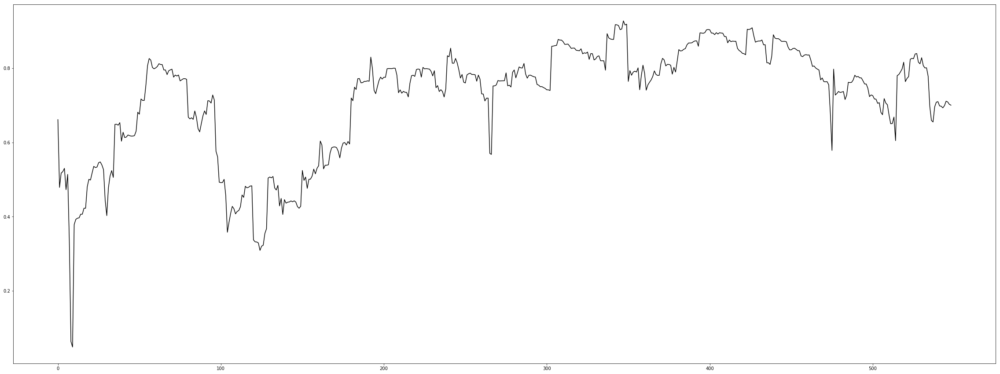


****************************
Data for  BNB-USD  and  XLM-USD
****************************

Evolution of the correlation over time


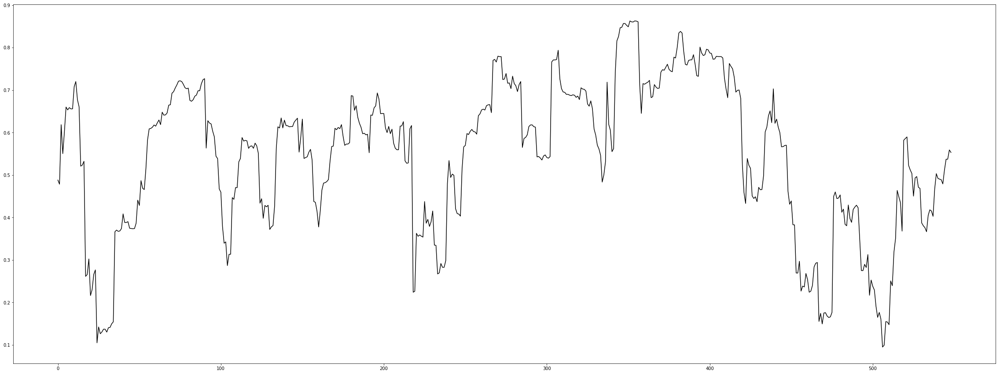


****************************
Data for  BNB-USD  and  ADA-USD
****************************

Evolution of the correlation over time


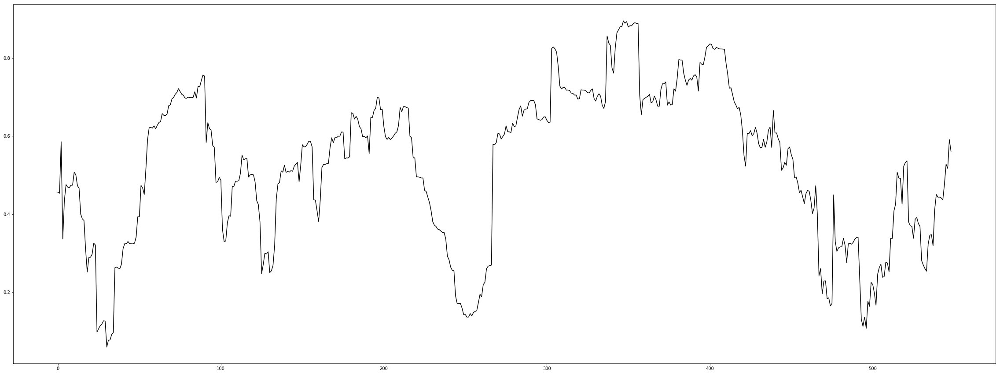


****************************
Data for  BNB-USD  and  TRX-USD
****************************

Evolution of the correlation over time


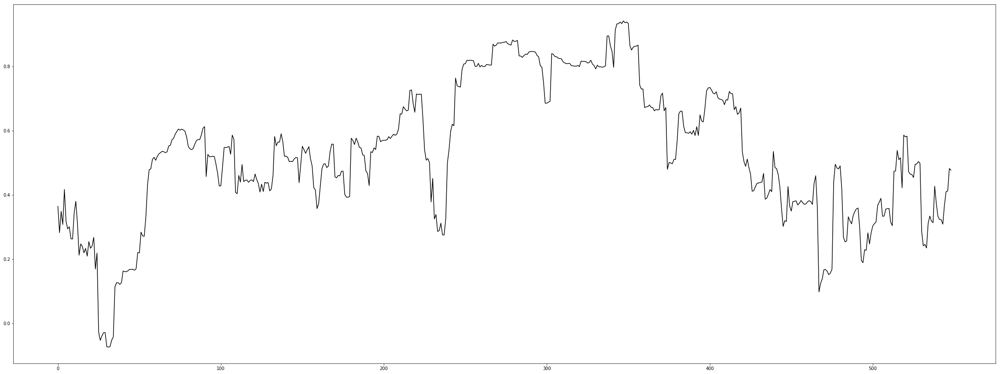


****************************
Data for  BNB-USD  and  XMR-USD
****************************

Evolution of the correlation over time


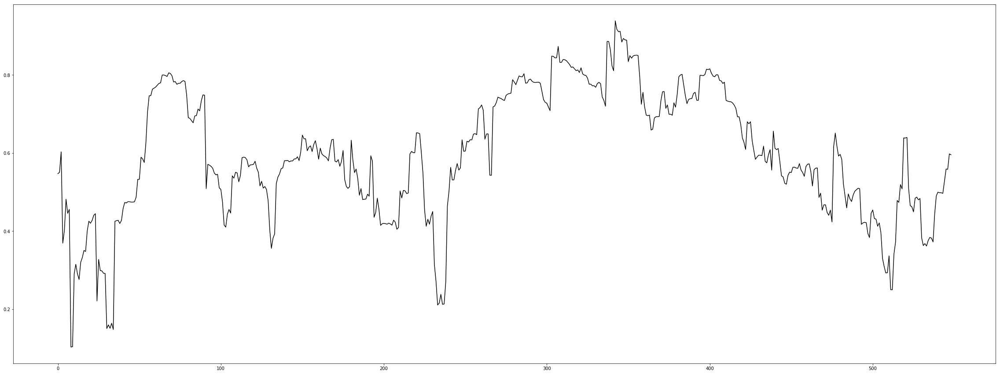


****************************
Data for  XLM-USD  and  ADA-USD
****************************

Evolution of the correlation over time


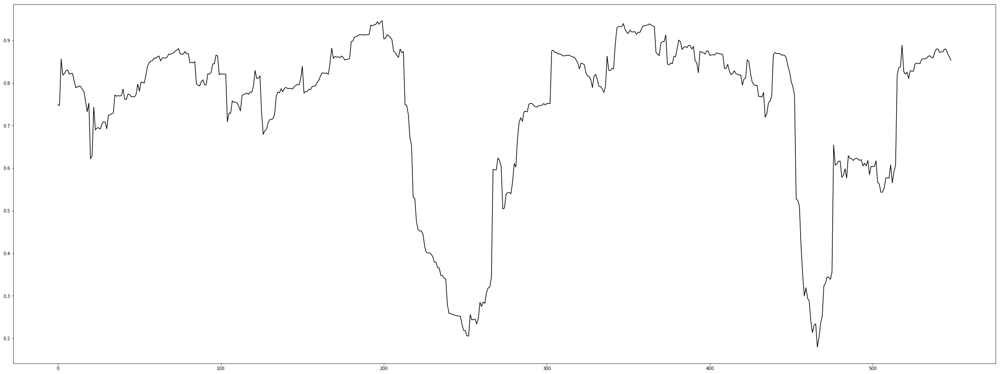


****************************
Data for  XLM-USD  and  TRX-USD
****************************

Evolution of the correlation over time


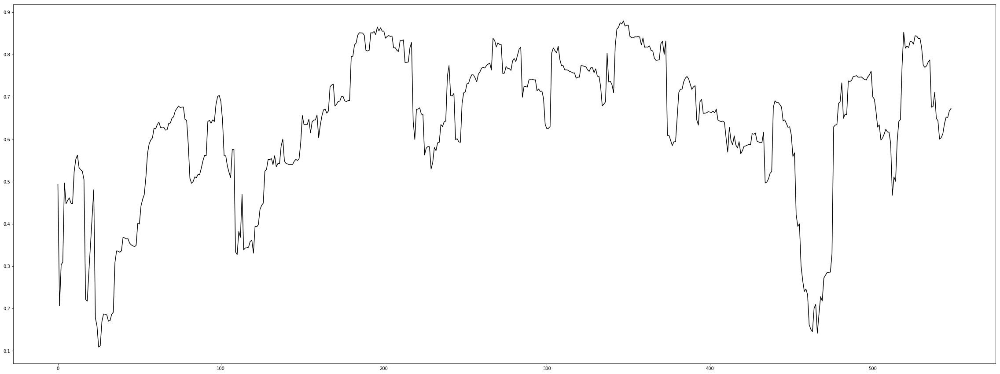


****************************
Data for  XLM-USD  and  XMR-USD
****************************

Evolution of the correlation over time


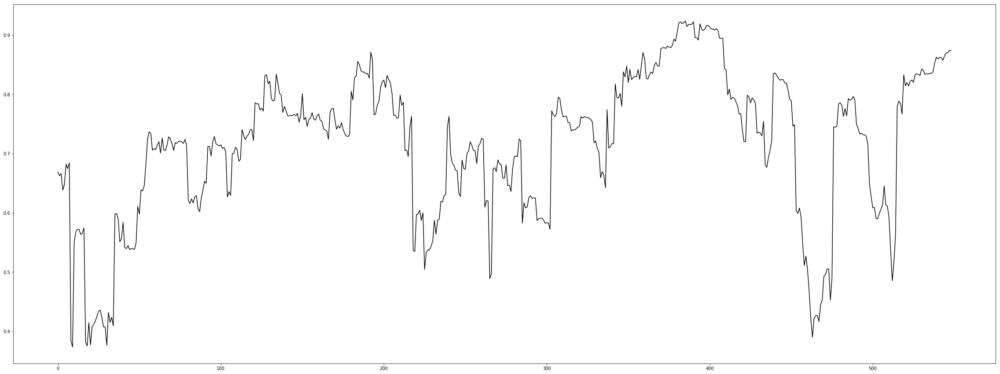


****************************
Data for  ADA-USD  and  TRX-USD
****************************

Evolution of the correlation over time


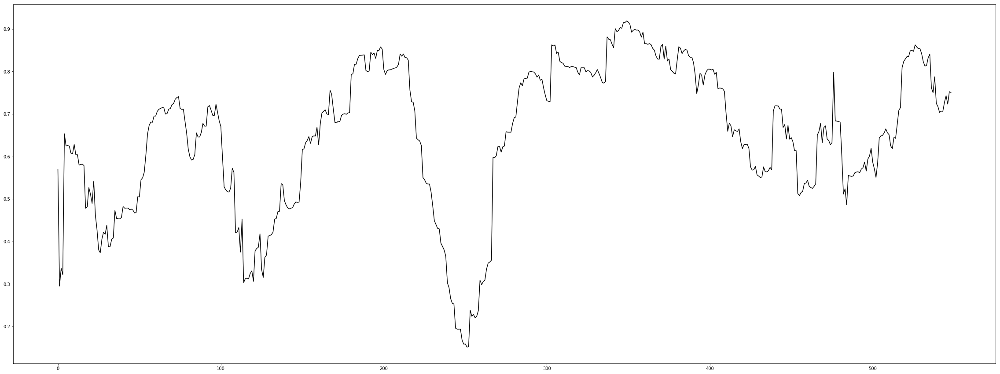


****************************
Data for  ADA-USD  and  XMR-USD
****************************

Evolution of the correlation over time


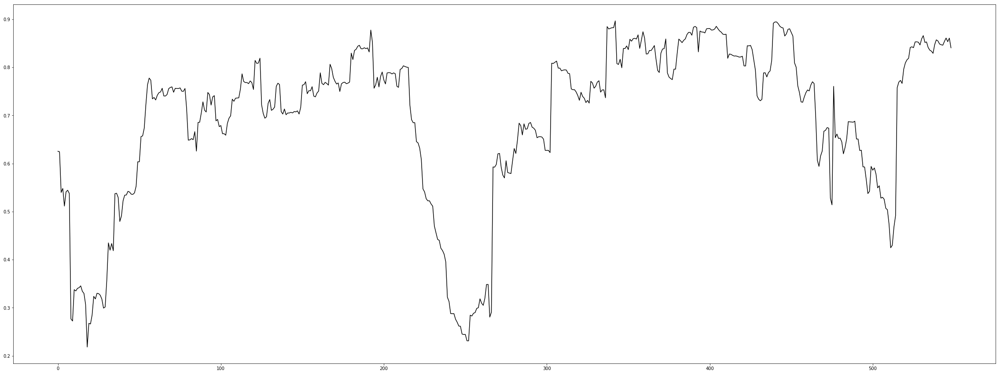


****************************
Data for  TRX-USD  and  XMR-USD
****************************

Evolution of the correlation over time


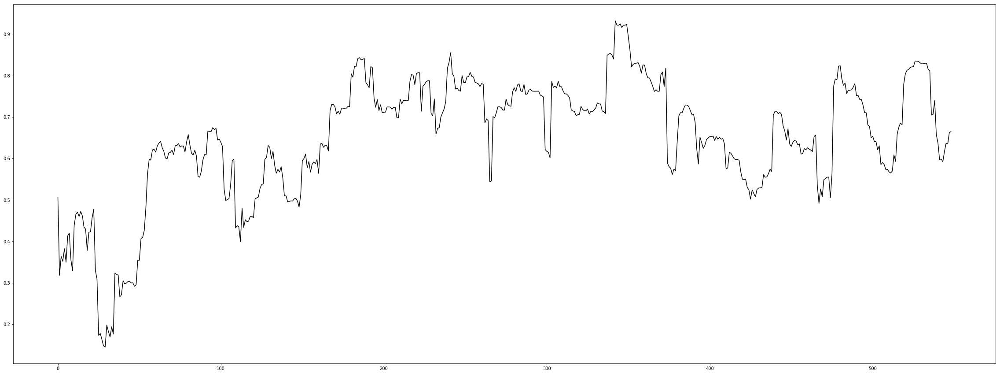

In [20]:
currencies = common_series[1:]
names = top_crypto_tickers[1:]
pair_corrs=[]
pair_corr_names=[]

for i in range (0,len(currencies)):
    for j in range(i+1, len(currencies)):
        a = currencies[i]
        b = currencies[j]
#         n1 = names[i]
#         n2 = names[j]
        
        rc = DCC(a,b)
        
        
        pair_corrs.append(rc)
        pair_corr_names.append(n1+' / '+n2)

# Question 9

In [21]:
pair_corrs_dfs = []
for a in pair_corrs:
    d = pd.DataFrame()
    d['corr'] = a
    d.index = common_series[0].index
    pair_corrs_dfs.append(d)

Average DCC correlation


/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


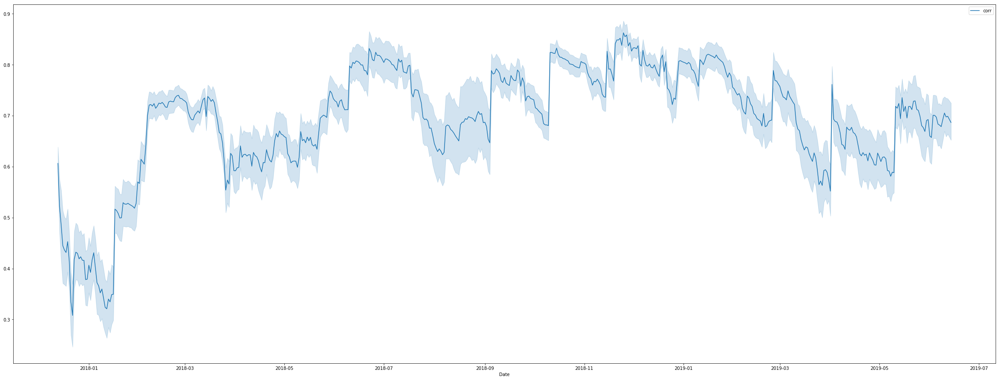

In [22]:
print('Average DCC correlation')

data = pd.concat( pair_corrs_dfs,axis=0)
plt.figure(figsize=(40, 15))
sns.lineplot(data=data,estimator='mean',ci=95)

## Comment
The DCC correlation follows the same pattern as the standard pairwise correlation, having a smaller confident interval, so the values are more concentrated around the mean which makes it a better estimate.

# Question 10

Overall the analysis shows that cryptocurrencies are a very riscy and volitile asset. The volitility is extremly hard to model which implies rather unpredictable behaviour. 

If one wishes to invest in it we would recomend choosing the top 2 currencies BTC and ETH, as they are the least volitile. Also the correlation analysis showed that cryptocurrencies are very correalted between each other, so having a portfolio of several might give a slight advantage, yet keeping more than several top currencies will not bring much proffit. 

Also all the currencies have a patternt of rising gradually at some point, so long-term investment in recently opened crypto currencies  might also be a good strategy